In [1]:
#1: to connect to drive
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [2]:
#2: to have shorter path
!ln -s /content/gdrive/My\ Drive/ /mydrive

In [3]:
#!ls /mydrive/colab/NordTank/darknet/data/ds_files/
%cd /mydrive/co1/newData

/content/gdrive/My Drive/co1/newData


In [4]:
%pwd

'/content/gdrive/My Drive/co1/newData'

In [5]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import MinMaxScaler
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
import seaborn as sns
from keras.layers import Input, Dense
from keras.models import Model, Sequential
from keras import regularizers

In [6]:
from sklearn import preprocessing

In [7]:
df = pd.read_excel('2941_2_lable.xlsx')
df=df.drop(["car_id", "timestamp", "alt", "satellites", "overspeedingtotaldistance", "bearing", "signalstrength", "totalidlingtime", "lat", "lng", "alarm", "hdop", "totalodometer", "obd_totalodometer", "switchlockendtime", "batterypercentage", "externalvoltage", "ERROR"],axis=1)
#print(df["ERROR"].value_counts()[1])
df=df.dropna()
#df4 = df["ERROR"]
#df=df.drop(["ERROR"],axis=1)
df.head()

#print(df)

min_max_Scalar = preprocessing.MinMaxScaler()

col = df.columns
result = min_max_Scalar.fit_transform(df)
min_max_Scalar_df = pd.DataFrame(result, columns=col)
df = min_max_Scalar_df
df.describe()


ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/IPython/core/interactiveshell.py", line 3553, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-7-2d0636aa01de>", line 1, in <cell line: 1>
    df = pd.read_excel('2941_2_lable.xlsx')
  File "/usr/local/lib/python3.10/dist-packages/pandas/util/_decorators.py", line 211, in wrapper
    return func(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/pandas/util/_decorators.py", line 331, in wrapper
    return func(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/pandas/io/excel/_base.py", line 490, in read_excel
    data = io.parse(
  File "/usr/local/lib/python3.10/dist-packages/pandas/io/excel/_base.py", line 1734, in parse
    return self._reader.parse(
  File "/usr/local/lib/python3.10/dist-packages/pandas/io/excel/_base.py", line 891, in parse
    output[asheetname] = parser.read(nrows=nrows)
  File "/usr/local/lib/python3.10/dist-pac

TypeError: ignored

<ipython-input-15-87b39962c37d>:16: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  mask = np.zeros_like(corr, dtype=np.bool)


<Axes: >

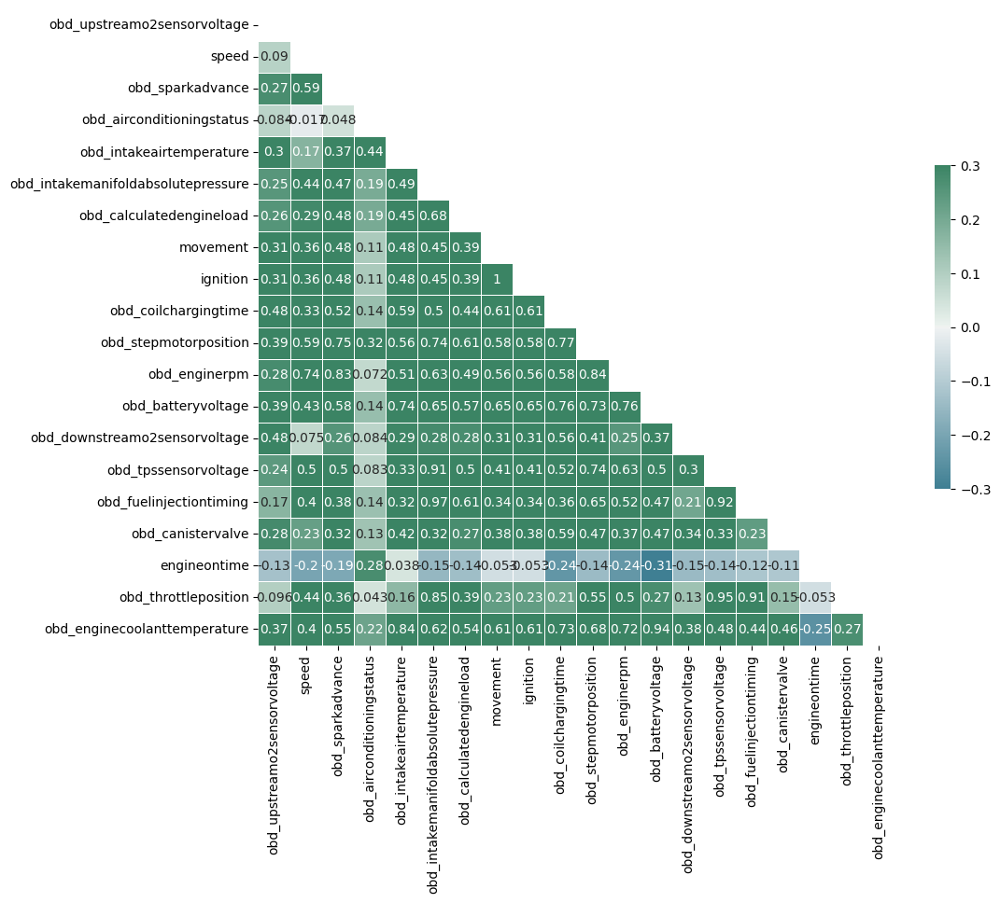

In [ ]:
# Standard imports
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt

# For this example we'll use Seaborn, which has some nice built in plots
import seaborn as sns

# Grab a data set from scikit-learn
from sklearn.datasets import fetch_california_housing

# Create the correlation matrix
corr = df.corr()

# Generate a mask for the upper triangle; True = do NOT show
mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(11, 9))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(220, 150, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
# More details at https://seaborn.pydata.org/generated/seaborn.heatmap.html
sns.heatmap(
    corr,          # The data to plot
    mask=mask,     # Mask some cells
    cmap=cmap,     # What colors to plot the heatmap as
    annot=True,    # Should the values be plotted in the cells?
    vmax=.3,       # The maximum value of the legend. All higher vals will be same color
    vmin=-.3,      # The minimum value of the legend. All lower vals will be same color
    center=0,      # The center value of the legend. With divergent cmap, where white is
    square=True,   # Force cells to be square
    linewidths=.5, # Width of lines that divide cells
    cbar_kws={"shrink": .5}  # Extra kwargs for the legend; in this case, shrink by 50%
)

<Axes: >

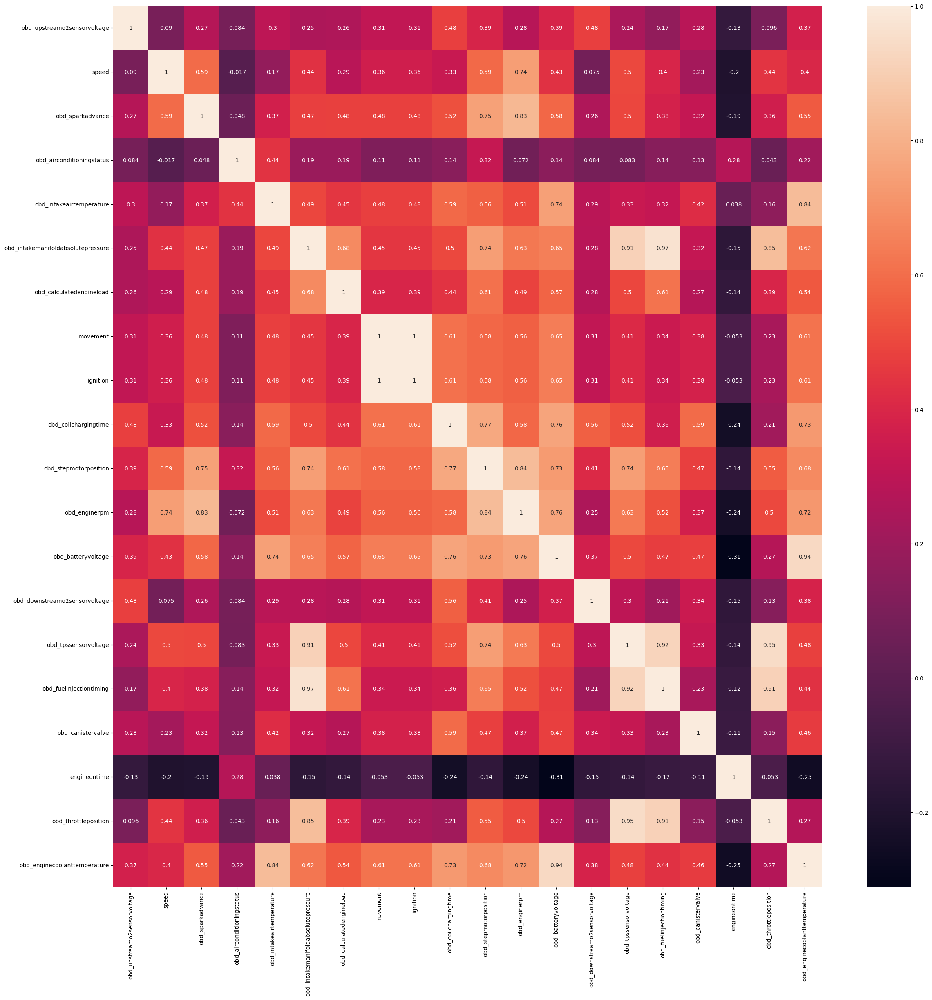

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
plt.figure(figsize=(28, 28))
sns.heatmap(df.corr(), annot=True)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 165077 entries, 0 to 165076
Data columns (total 20 columns):
 #   Column                              Non-Null Count   Dtype  
---  ------                              --------------   -----  
 0   obd_upstreamo2sensorvoltage         165077 non-null  float64
 1   speed                               165077 non-null  float64
 2   obd_sparkadvance                    165077 non-null  float64
 3   obd_airconditioningstatus           165077 non-null  float64
 4   obd_intakeairtemperature            165077 non-null  float64
 5   obd_intakemanifoldabsolutepressure  165077 non-null  float64
 6   obd_calculatedengineload            165077 non-null  float64
 7   movement                            165077 non-null  float64
 8   ignition                            165077 non-null  float64
 9   obd_coilchargingtime                165077 non-null  float64
 10  obd_stepmotorposition               165077 non-null  float64
 11  obd_enginerpm             

In [ ]:
df

,obd_upstreamo2sensorvoltage,speed,obd_sparkadvance,obd_airconditioningstatus,obd_intakeairtemperature,obd_intakemanifoldabsolutepressure,obd_calculatedengineload,movement,ignition,obd_coilchargingtime,obd_stepmotorposition,obd_enginerpm,obd_batteryvoltage,obd_downstreamo2sensorvoltage,obd_tpssensorvoltage,obd_fuelinjectiontiming,obd_canistervalve,engineontime,obd_throttleposition,obd_enginecoolanttemperature
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000019,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000019,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000019,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000019,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
165072,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.000000,0.0,0.0
165073,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.000000,0.0,0.0
165074,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.000000,0.0,0.0
165075,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.000000,0.0,0.0


In [ ]:
import tensorflow as tf
import random as rn

# manual parameters
RANDOM_SEED = 42
TRAINING_SAMPLE = 16316
VALIDATE_SIZE = 0.2
# setting random seeds for libraries to ensure reproducibility
np.random.seed(RANDOM_SEED)
rn.seed(RANDOM_SEED)


In [ ]:
from sklearn.model_selection import train_test_split
df_train, df_test = train_test_split(df, test_size=0.33, random_state=1)

# train // validate - no labels since they're all clean anyway
X_train, X_validate = train_test_split(df_train, test_size=VALIDATE_SIZE, random_state=RANDOM_SEED)
# summarize
print('Train', X_train.shape)
print('Test', df_test.shape)
print('validate', X_validate.shape)


Train (88480, 20)
Test (54476, 20)
validate (22121, 20)


In [ ]:
X_train


,obd_upstreamo2sensorvoltage,speed,obd_sparkadvance,obd_airconditioningstatus,obd_intakeairtemperature,obd_intakemanifoldabsolutepressure,obd_calculatedengineload,movement,ignition,obd_coilchargingtime,obd_stepmotorposition,obd_enginerpm,obd_batteryvoltage,obd_downstreamo2sensorvoltage,obd_tpssensorvoltage,obd_fuelinjectiontiming,obd_canistervalve,engineontime,obd_throttleposition,obd_enginecoolanttemperature
148401,0.111789,0.000000,0.230769,1.0,0.483146,0.413364,0.419608,1.0,1.0,0.25,0.538462,0.226636,0.928571,0.397260,0.096448,0.136364,0.666667,0.808804,0.00,0.594059
153067,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,1.0,1.0,0.00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.857252,0.00,0.000000
46216,0.757114,0.204380,0.743590,0.0,0.505618,0.558324,0.600000,1.0,1.0,0.25,0.538462,0.430756,0.928571,0.187215,0.210118,0.272727,0.000000,0.258138,0.12,0.792079
127985,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.675416,0.00,0.000000
49425,0.096545,0.182482,0.230769,0.0,0.539326,0.298981,0.270588,1.0,1.0,0.25,0.333333,0.220901,0.928571,0.391781,0.100753,0.090909,1.000000,0.275143,0.00,0.821782
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6141,0.721545,0.576642,0.564103,0.0,0.235955,0.887882,0.152941,1.0,1.0,0.25,0.743590,0.758921,0.928571,0.689498,0.470614,0.500000,1.000000,0.032372,0.41,0.801980
97378,0.772358,0.532847,0.641026,0.0,0.505618,0.702152,0.788235,1.0,1.0,0.25,0.623932,0.549703,0.928571,0.817352,0.285684,0.318182,1.000000,0.518493,0.21,0.772277
152207,0.147358,0.000000,0.128205,0.0,0.539326,0.338618,0.313725,1.0,1.0,0.25,0.367521,0.194987,0.928571,0.665753,0.096448,0.090909,1.000000,0.847038,0.00,0.851485
83129,0.889228,0.072993,0.487179,0.0,0.730337,0.696489,0.760784,1.0,1.0,0.25,0.435897,0.309048,0.928571,0.397260,0.214209,0.318182,1.000000,0.450893,0.12,0.792079


In [ ]:
#X_train_ERROR=X_train["ERROR"]
#X_train=X_train.drop(["ERROR"],axis=1)
#X_validate_ERROR= X_validate["ERROR"]
#X_validate= X_validate.drop(["ERROR"],axis=1)

In [ ]:
X_train


,obd_upstreamo2sensorvoltage,speed,obd_sparkadvance,obd_airconditioningstatus,obd_intakeairtemperature,obd_intakemanifoldabsolutepressure,obd_calculatedengineload,movement,ignition,obd_coilchargingtime,obd_stepmotorposition,obd_enginerpm,obd_batteryvoltage,obd_downstreamo2sensorvoltage,obd_tpssensorvoltage,obd_fuelinjectiontiming,obd_canistervalve,engineontime,obd_throttleposition,obd_enginecoolanttemperature
148401,0.111789,0.000000,0.230769,1.0,0.483146,0.413364,0.419608,1.0,1.0,0.25,0.538462,0.226636,0.928571,0.397260,0.096448,0.136364,0.666667,0.808804,0.00,0.594059
153067,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,1.0,1.0,0.00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.857252,0.00,0.000000
46216,0.757114,0.204380,0.743590,0.0,0.505618,0.558324,0.600000,1.0,1.0,0.25,0.538462,0.430756,0.928571,0.187215,0.210118,0.272727,0.000000,0.258138,0.12,0.792079
127985,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.675416,0.00,0.000000
49425,0.096545,0.182482,0.230769,0.0,0.539326,0.298981,0.270588,1.0,1.0,0.25,0.333333,0.220901,0.928571,0.391781,0.100753,0.090909,1.000000,0.275143,0.00,0.821782
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6141,0.721545,0.576642,0.564103,0.0,0.235955,0.887882,0.152941,1.0,1.0,0.25,0.743590,0.758921,0.928571,0.689498,0.470614,0.500000,1.000000,0.032372,0.41,0.801980
97378,0.772358,0.532847,0.641026,0.0,0.505618,0.702152,0.788235,1.0,1.0,0.25,0.623932,0.549703,0.928571,0.817352,0.285684,0.318182,1.000000,0.518493,0.21,0.772277
152207,0.147358,0.000000,0.128205,0.0,0.539326,0.338618,0.313725,1.0,1.0,0.25,0.367521,0.194987,0.928571,0.665753,0.096448,0.090909,1.000000,0.847038,0.00,0.851485
83129,0.889228,0.072993,0.487179,0.0,0.730337,0.696489,0.760784,1.0,1.0,0.25,0.435897,0.309048,0.928571,0.397260,0.214209,0.318182,1.000000,0.450893,0.12,0.792079


In [ ]:
# Load the extension and start TensorBoard
%load_ext tensorboard
%tensorboard --logdir logs

<IPython.core.display.Javascript object>

In [ ]:
# data dimensions // hyperparameters
input_dim = X_train.shape[1]
BATCH_SIZE = 100
EPOCHS = 50

# https://keras.io/layers/core/
autoencoder = tf.keras.models.Sequential([

    # deconstruct / encode
    tf.keras.layers.Dense(input_dim, activation='elu', input_shape=(input_dim, )),
    #tf.keras.layers.Dense(44, activation='elu'),
    #tf.keras.layers.Dense(20, activation='elu'),
    tf.keras.layers.Dense(12, activation='elu'),
    #tf.keras.layers.Dense(30, activation='elu'),
    #tf.keras.layers.Dense(48, activation='elu'),

    #tf.keras.layers.Dense(8, activation='elu'),

    # reconstruction / decode
    #tf.keras.layers.Dense(7, activation='elu'),
    #tf.keras.layers.Dense(10, activation='elu'),
    #tf.keras.layers.Dense(30, activation='elu'),
    #tf.keras.layers.Dense(20, activation='elu'),
    #tf.keras.layers.Dense(44, activation='elu'),
    tf.keras.layers.Dense(input_dim, activation='elu')

])

# https://keras.io/api/models/model_training_apis/
autoencoder.compile(optimizer="adam",
                    loss="mae",
                    metrics=["mae"])

# print an overview of our model
autoencoder.summary();

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 20)                420       
                                                                 
 dense_1 (Dense)             (None, 12)                252       
                                                                 
 dense_2 (Dense)             (None, 20)                260       
                                                                 
Total params: 932 (3.64 KB)
Trainable params: 932 (3.64 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [ ]:
 from datetime import datetime

# # current date and time
yyyymmddHHMM = datetime.now().strftime('%Y%m%d%H%M')

# # new folder for a new run
log_subdir = f'{yyyymmddHHMM}_batch{BATCH_SIZE}_layers{len(autoencoder.layers)}'

# # define our early stopping
early_stop = tf.keras.callbacks.EarlyStopping(
    monitor='val_loss',
    min_delta=0.0001,
    patience=10,
    verbose=1,
    mode='min',
    restore_best_weights=True
)

save_model = tf.keras.callbacks.ModelCheckpoint(
    filepath='autoencoder_best_weights.hdf5',
    save_best_only=True,
    monitor='val_loss',
    verbose=0,
    mode='min'
)

tensorboard = tf.keras.callbacks.TensorBoard(
    f'logs/{log_subdir}',
    batch_size=BATCH_SIZE,
    update_freq='batch'
)

# callbacks argument only takes a list
cb = [early_stop, save_model, tensorboard]

In [ ]:
df

,obd_upstreamo2sensorvoltage,speed,obd_sparkadvance,obd_airconditioningstatus,obd_intakeairtemperature,obd_intakemanifoldabsolutepressure,obd_calculatedengineload,movement,ignition,obd_coilchargingtime,obd_stepmotorposition,obd_enginerpm,obd_batteryvoltage,obd_downstreamo2sensorvoltage,obd_tpssensorvoltage,obd_fuelinjectiontiming,obd_canistervalve,engineontime,obd_throttleposition,obd_enginecoolanttemperature
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000019,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000019,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000019,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000019,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
165072,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.000000,0.0,0.0
165073,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.000000,0.0,0.0
165074,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.000000,0.0,0.0
165075,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.000000,0.0,0.0


In [ ]:
history = autoencoder.fit(
    X_train, X_train,
    shuffle=True,
    epochs=EPOCHS,
    batch_size=BATCH_SIZE,
    callbacks=cb,
    validation_data=(X_validate, X_validate)
)

Epoch 1/50
869/885 [============================>.] - ETA: 0s - loss: 0.0966 - mae: 0.0966

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


885/885 [==============================] - 5s 4ms/step - loss: 0.0958 - mae: 0.0958 - val_loss: 0.0516 - val_mae: 0.0516
Epoch 2/50
885/885 [==============================] - 3s 3ms/step - loss: 0.0385 - mae: 0.0385 - val_loss: 0.0276 - val_mae: 0.0276
Epoch 3/50
885/885 [==============================] - 3s 3ms/step - loss: 0.0251 - mae: 0.0251 - val_loss: 0.0232 - val_mae: 0.0232
Epoch 4/50
885/885 [==============================] - 3s 3ms/step - loss: 0.0220 - mae: 0.0220 - val_loss: 0.0210 - val_mae: 0.0210
Epoch 5/50
885/885 [==============================] - 3s 4ms/step - loss: 0.0202 - mae: 0.0202 - val_loss: 0.0195 - val_mae: 0.0195
Epoch 6/50
885/885 [==============================] - 3s 3ms/step - loss: 0.0186 - mae: 0.0186 - val_loss: 0.0175 - val_mae: 0.0175
Epoch 7/50
885/885 [==============================] - 3s 4ms/step - loss: 0.0168 - mae: 0.0168 - val_loss: 0.0158 - val_mae: 0.0158
Epoch 8/50
885/885 [==============================] - 4s 5ms/step - loss: 0.0157 - mae:

In [ ]:
history.history.keys()

dict_keys(['loss', 'mae', 'val_loss', 'val_mae'])

Text(0.5, 1.0, 'Mae for AutoEncoder')

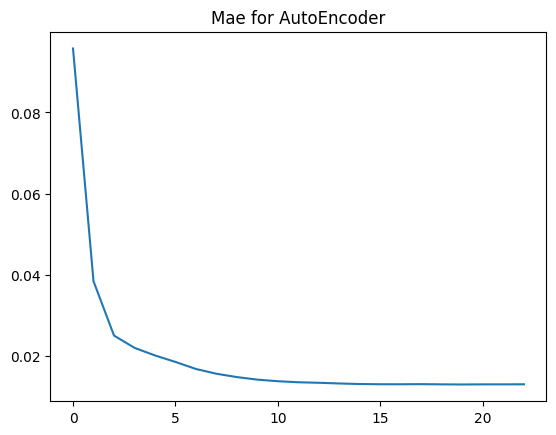

In [ ]:
import matplotlib.pyplot as plt
plt.plot(history.history['mae'])
plt.title("Mae for AutoEncoder")


Text(0.5, 1.0, 'loss for AutoEncoder')

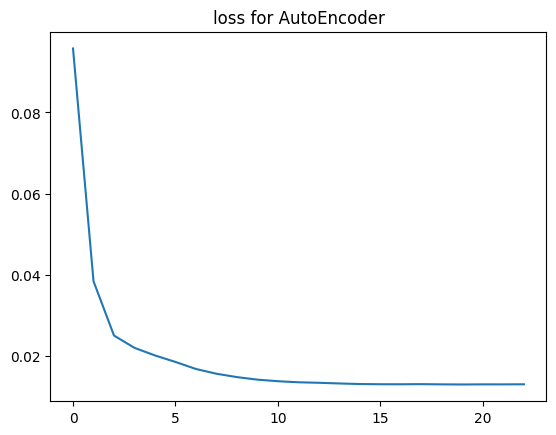

In [ ]:
plt.plot(history.history['loss'])
plt.title("loss for AutoEncoder")

Text(0.5, 1.0, 'Value for AutoEncoder')

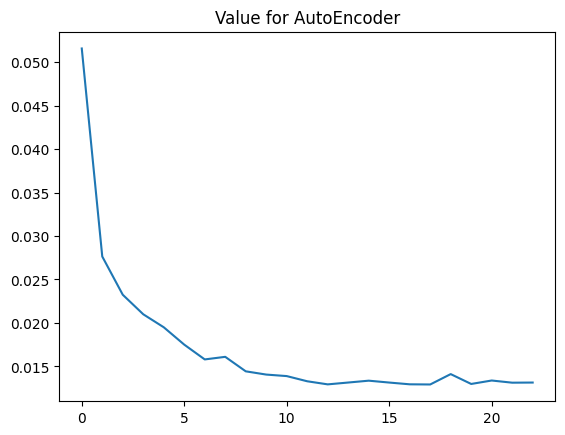

In [ ]:
plt.plot(history.history['val_loss'])
plt.title("Value for AutoEncoder")

Text(0.5, 1.0, 'val_mae for AutoEncoder')

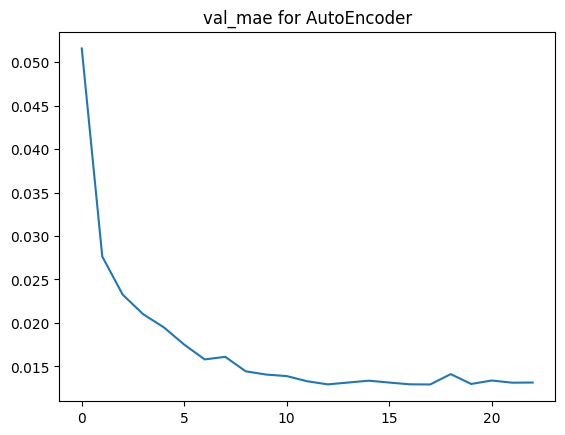

In [ ]:
plt.plot(history.history['val_mae'])
plt.title("val_mae for AutoEncoder")

In [ ]:
X_validate2 = X_validate.reset_index(drop=True)
reconstructions = autoencoder.predict(X_validate2)
mse = np.mean(np.power(X_validate2 - reconstructions, 2), axis=1)

692/692 [==============================] - 1s 935us/step


In [ ]:
df6 = pd.DataFrame(reconstructions,columns=X_validate2.columns)

#obd_intakeairtemperature

In [ ]:
from sklearn.metrics import r2_score
u = X_validate2['obd_intakeairtemperature']
df_u = pd.DataFrame(u)
df_u['yhat']= df6['obd_intakeairtemperature']
r2 = r2_score(u, df_u['yhat'])
#mae = mean_absolute_error(u, df_u['yhat'])
df_u['tafrigh'] = u - df_u['yhat']


In [ ]:
r2


0.9983686289152239

In [ ]:
obd_intakeairtemperature1 = r2

In [ ]:
d= df_u
d


,obd_intakeairtemperature,yhat,tafrigh
0,0.269663,0.268005,0.001658
1,0.325843,0.318107,0.007736
2,0.606742,0.606120,0.000621
3,0.707865,0.704951,0.002915
4,0.764045,0.754871,0.009174
...,...,...,...
22116,0.000000,-0.004114,0.004114
22117,0.213483,0.162462,0.051021
22118,0.000000,-0.001310,0.001310
22119,0.359551,0.359074,0.000477


In [ ]:
(abs(d ['tafrigh'].sort_values(ascending=False)).mean())+(3*(abs(d ['tafrigh'].sort_values(ascending=False)).std()))

0.02982751316184247

In [ ]:
abs(d ['tafrigh'].sort_values(ascending=False)).mean()

0.006284428309409954

In [ ]:
abs(d ['tafrigh'].sort_values(ascending=False)).std()

0.007847694950810839

In [ ]:
d ['tafrigh'].sort_values(ascending=False)

1834     0.068667
21480    0.064144
19630    0.061628
20985    0.061252
16727    0.060239
           ...   
10904   -0.076765
2247    -0.080966
17328   -0.082599
8815    -0.086695
543     -0.092332
Name: tafrigh, Length: 22121, dtype: float64

In [ ]:
e=d ['tafrigh']
e

0        0.001658
1        0.007736
2        0.000621
3        0.002915
4        0.009174
           ...   
22116    0.004114
22117    0.051021
22118    0.001310
22119    0.000477
22120   -0.002169
Name: tafrigh, Length: 22121, dtype: float64

<ipython-input-45-50b89cb75ce2>:12: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sb.distplot(e)


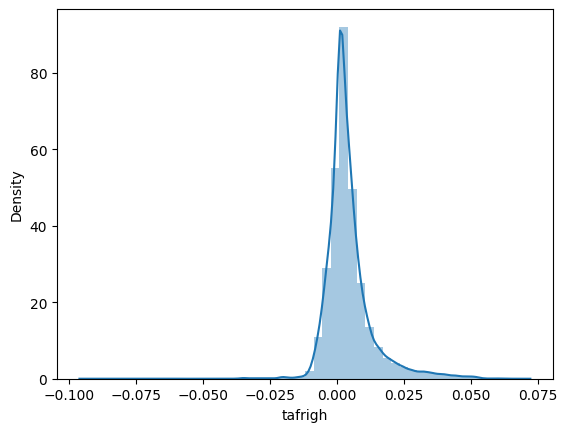

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sb
from scipy.stats import pearsonr
import numpy as np
import seaborn as sb
# 0: miyangin , 1: enheraf meyar , size: tedade adade random
#sample=np.random.normal(0,1,size=10000)
# size 1000 chon megdaresh ziyad hast, neshon dade nemishe.
#print("adade random: ",sample)
sb.distplot(e)
plt.show()

# obd_fuelinjectiontiming

In [ ]:
from sklearn.metrics import r2_score
u = X_validate2['obd_fuelinjectiontiming']
df_u = pd.DataFrame(u)
df_u['yhat']= df6['obd_fuelinjectiontiming']
r2 = r2_score(u, df_u['yhat'])
#mae = mean_absolute_error(u, df_u['yhat'])
df_u['tafrigh'] = u - df_u['yhat']


In [ ]:
r2


0.9827255003591756

In [ ]:
obd_fuelinjectiontiming1 = r2

In [ ]:
d= df_u
d


,obd_fuelinjectiontiming,yhat,tafrigh
0,0.045455,0.061794,-0.016340
1,0.227273,0.241189,-0.013916
2,0.090909,0.081180,0.009729
3,0.181818,0.193266,-0.011448
4,0.090909,0.064934,0.025975
...,...,...,...
22116,0.000000,0.000904,-0.000904
22117,0.136364,0.118590,0.017774
22118,0.000000,0.000951,-0.000951
22119,0.318182,0.303498,0.014683


In [ ]:
(abs(d ['tafrigh'].sort_values(ascending=False)).mean())+(3*(abs(d ['tafrigh'].sort_values(ascending=False)).std()))

0.05442469714785696

In [ ]:
abs(d ['tafrigh'].sort_values(ascending=False)).mean()

0.010782395499070866

In [ ]:
abs(d ['tafrigh'].sort_values(ascending=False)).std()

0.014547433882928697

In [ ]:
d ['tafrigh'].sort_values(ascending=False)

9055     0.148858
21165    0.128816
7443     0.128083
9438     0.117622
5063     0.114792
           ...   
14756   -0.375253
18258   -0.378096
10480   -0.380099
16174   -0.394035
20985   -0.448880
Name: tafrigh, Length: 22121, dtype: float64

In [ ]:
abs(d ['tafrigh'].sort_values(ascending=False)).std()

0.014547433882928697

In [ ]:
e=d ['tafrigh']
e

0       -0.016340
1       -0.013916
2        0.009729
3       -0.011448
4        0.025975
           ...   
22116   -0.000904
22117    0.017774
22118   -0.000951
22119    0.014683
22120   -0.019069
Name: tafrigh, Length: 22121, dtype: float64

<ipython-input-56-50b89cb75ce2>:12: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sb.distplot(e)


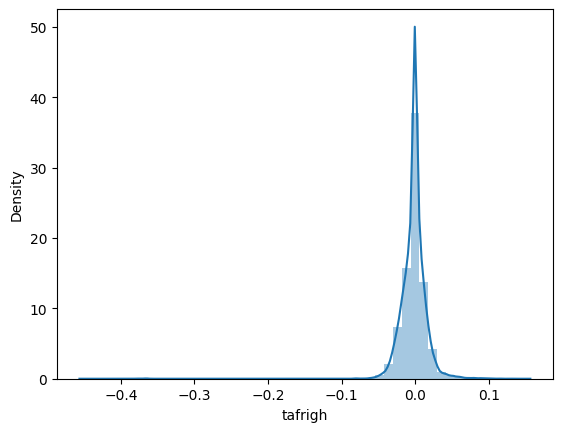

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sb
from scipy.stats import pearsonr
import numpy as np
import seaborn as sb
# 0: miyangin , 1: enheraf meyar , size: tedade adade random
#sample=np.random.normal(0,1,size=10000)
# size 1000 chon megdaresh ziyad hast, neshon dade nemishe.
#print("adade random: ",sample)
sb.distplot(e)
plt.show()

# obd_throttleposition


In [ ]:
from sklearn.metrics import r2_score
u = X_validate2['obd_throttleposition']
df_u = pd.DataFrame(u)
df_u['yhat']= df6['obd_throttleposition']
r2 = r2_score(u, df_u['yhat'])
#mae = mean_absolute_error(u, df_u['yhat'])
df_u['tafrigh'] = u - df_u['yhat']


In [ ]:
r2

0.9125277355930121

In [ ]:
obd_throttleposition1 = r2

In [ ]:
d= df_u
d


,obd_throttleposition,yhat,tafrigh
0,0.00,-0.009786,0.009786
1,0.14,0.140460,-0.000460
2,0.00,-0.006065,0.006065
3,0.08,0.083195,-0.003195
4,0.00,-0.001974,0.001974
...,...,...,...
22116,0.00,0.003096,-0.003096
22117,0.00,0.015960,-0.015960
22118,0.00,0.001387,-0.001387
22119,0.12,0.153940,-0.033940


In [ ]:
(abs(d ['tafrigh'].sort_values(ascending=False)).mean())+(3*(abs(d ['tafrigh'].sort_values(ascending=False)).std()))

0.08871182278453826

In [ ]:
abs(d ['tafrigh'].sort_values(ascending=False)).mean()

0.014659289022275509

In [ ]:
abs(d ['tafrigh'].sort_values(ascending=False)).std()

0.024684177920754252

In [ ]:
d ['tafrigh'].sort_values(ascending=False)

7150     0.642932
19876    0.487746
16455    0.425879
9920     0.414733
5851     0.395474
           ...   
14756   -0.144917
16174   -0.145756
904     -0.145895
10480   -0.148984
2749    -0.185152
Name: tafrigh, Length: 22121, dtype: float64

In [ ]:
e=d ['tafrigh']
e

0        0.009786
1       -0.000460
2        0.006065
3       -0.003195
4        0.001974
           ...   
22116   -0.003096
22117   -0.015960
22118   -0.001387
22119   -0.033940
22120    0.011590
Name: tafrigh, Length: 22121, dtype: float64

<ipython-input-66-50b89cb75ce2>:12: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sb.distplot(e)


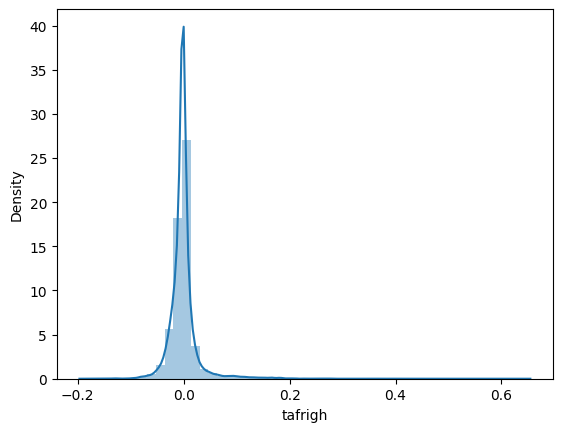

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sb
from scipy.stats import pearsonr
import numpy as np
import seaborn as sb
# 0: miyangin , 1: enheraf meyar , size: tedade adade random
#sample=np.random.normal(0,1,size=10000)
# size 1000 chon megdaresh ziyad hast, neshon dade nemishe.
#print("adade random: ",sample)
sb.distplot(e)
plt.show()

# obd_stepmotorposition

In [ ]:
from sklearn.metrics import r2_score
u = X_validate2['obd_stepmotorposition']
df_u = pd.DataFrame(u)
df_u['yhat']= df6['obd_stepmotorposition']
r2 = r2_score(u, df_u['yhat'])
#mae = mean_absolute_error(u, df_u['yhat'])
df_u['tafrigh'] = u - df_u['yhat']


In [ ]:
r2

0.8485173648718563

In [ ]:
obd_stepmotorposition1 = r2

In [ ]:
d= df_u
d


,obd_stepmotorposition,yhat,tafrigh
0,0.307692,0.323961,-0.016269
1,0.598291,0.575400,0.022890
2,0.247863,0.247976,-0.000113
3,0.444444,0.461824,-0.017379
4,0.316239,0.331549,-0.015310
...,...,...,...
22116,0.264957,0.093808,0.171149
22117,0.478632,0.319310,0.159323
22118,0.000000,-0.000638,0.000638
22119,0.461538,0.505902,-0.044364


In [ ]:
(abs(d ['tafrigh'].sort_values(ascending=False)).mean())+(3*(abs(d ['tafrigh'].sort_values(ascending=False)).std()))

0.22121284685010567

In [ ]:
abs(d ['tafrigh'].sort_values(ascending=False)).mean()

0.04320077845400062

In [ ]:
abs(d ['tafrigh'].sort_values(ascending=False)).std()

0.059337356132035016

In [ ]:
d ['tafrigh'].sort_values(ascending=False)

10904    0.797653
2749     0.652776
18132    0.523877
13073    0.521193
3961     0.521193
           ...   
7332    -0.157561
11065   -0.160178
3766    -0.205707
17258   -0.312806
4304    -0.408783
Name: tafrigh, Length: 22121, dtype: float64

In [ ]:
e=d ['tafrigh']
e

0       -0.016269
1        0.022890
2       -0.000113
3       -0.017379
4       -0.015310
           ...   
22116    0.171149
22117    0.159323
22118    0.000638
22119   -0.044364
22120   -0.079765
Name: tafrigh, Length: 22121, dtype: float64

<ipython-input-76-50b89cb75ce2>:12: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sb.distplot(e)


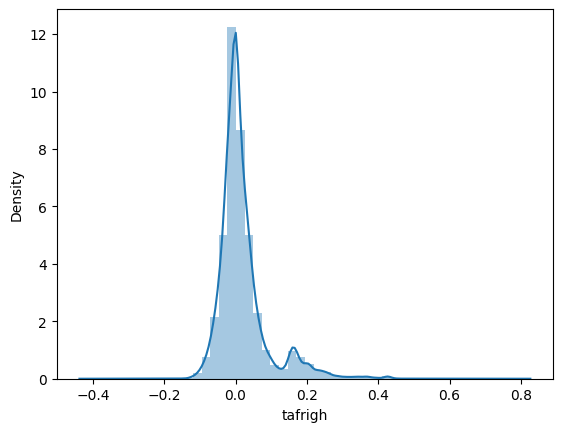

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sb
from scipy.stats import pearsonr
import numpy as np
import seaborn as sb
# 0: miyangin , 1: enheraf meyar , size: tedade adade random
#sample=np.random.normal(0,1,size=10000)
# size 1000 chon megdaresh ziyad hast, neshon dade nemishe.
#print("adade random: ",sample)
sb.distplot(e)
plt.show()

# obd_enginerpm

In [ ]:
from sklearn.metrics import r2_score
u = X_validate2['obd_enginerpm']
df_u = pd.DataFrame(u)
df_u['yhat']= df6['obd_enginerpm']
r2 = r2_score(u, df_u['yhat'])
#mae = mean_absolute_error(u, df_u['yhat'])
df_u['tafrigh'] = u - df_u['yhat']

In [ ]:
r2

0.9986928606563485

In [ ]:
obd_enginerpm1 = r2

In [ ]:
d= df_u
d


,obd_enginerpm,yhat,tafrigh
0,0.309898,0.307382,0.002516
1,0.534622,0.538095,-0.003473
2,0.181181,0.174544,0.006637
3,0.344095,0.338533,0.005562
4,0.265081,0.265996,-0.000915
...,...,...,...
22116,0.000000,0.002633,-0.002633
22117,0.243628,0.246027,-0.002399
22118,0.000000,-0.000614,0.000614
22119,0.383390,0.375258,0.008132


In [ ]:
(abs(d ['tafrigh'].sort_values(ascending=False)).mean())+(3*(abs(d ['tafrigh'].sort_values(ascending=False)).std()))

0.02046352242259034

In [ ]:
abs(d ['tafrigh'].sort_values(ascending=False)).mean()

0.004682211333662028

In [ ]:
abs(d ['tafrigh'].sort_values(ascending=False)).std()

0.005260437029642771

In [ ]:
d ['tafrigh'].sort_values(ascending=False)

7009     0.064081
31       0.063298
18258    0.058864
7169     0.057281
16174    0.056945
           ...   
17328   -0.061348
19876   -0.068844
8815    -0.074684
10904   -0.089086
7150    -0.099201
Name: tafrigh, Length: 22121, dtype: float64

In [ ]:
e=d ['tafrigh']
e

0        0.002516
1       -0.003473
2        0.006637
3        0.005562
4       -0.000915
           ...   
22116   -0.002633
22117   -0.002399
22118    0.000614
22119    0.008132
22120    0.007225
Name: tafrigh, Length: 22121, dtype: float64

<ipython-input-86-50b89cb75ce2>:12: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sb.distplot(e)


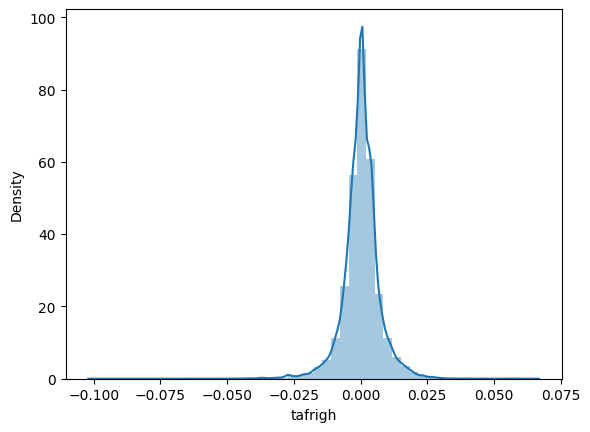

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sb
from scipy.stats import pearsonr
import numpy as np
import seaborn as sb
# 0: miyangin , 1: enheraf meyar , size: tedade adade random
#sample=np.random.normal(0,1,size=10000)
# size 1000 chon megdaresh ziyad hast, neshon dade nemishe.
#print("adade random: ",sample)
sb.distplot(e)
plt.show()

# obd_coilchargingtime

In [ ]:
from sklearn.metrics import r2_score
u = X_validate2['obd_coilchargingtime']
df_u = pd.DataFrame(u)
df_u['yhat']= df6['obd_coilchargingtime']
r2 = r2_score(u, df_u['yhat'])
#mae = mean_absolute_error(u, df_u['yhat'])
df_u['tafrigh'] = u - df_u['yhat']

In [ ]:
r2

0.36243626118498096

In [ ]:
obd_coilchargingtime1 = r2

In [ ]:
d= df_u
d


,obd_coilchargingtime,yhat,tafrigh
0,0.25,0.267580,-0.017580
1,0.25,0.248975,0.001025
2,0.25,0.248539,0.001461
3,0.25,0.251184,-0.001184
4,0.25,0.249176,0.000824
...,...,...,...
22116,0.25,0.004471,0.245529
22117,0.25,0.259445,-0.009445
22118,0.00,0.000066,-0.000066
22119,0.25,0.250487,-0.000487


In [ ]:
(abs(d ['tafrigh'].sort_values(ascending=False)).mean())+(3*(abs(d ['tafrigh'].sort_values(ascending=False)).std()))

0.2089854142015944

In [ ]:
abs(d ['tafrigh'].sort_values(ascending=False)).mean()

0.019762036386350358

In [ ]:
abs(d ['tafrigh'].sort_values(ascending=False)).std()

0.06307445927174801

In [ ]:
d ['tafrigh'].sort_values(ascending=False)

10904    1.006275
2749     0.887273
3961     0.333423
13073    0.333423
2481     0.333415
           ...   
21219   -0.020088
15556   -0.020217
9172    -0.020421
16157   -0.020506
13707   -0.020671
Name: tafrigh, Length: 22121, dtype: float64

In [ ]:
e=d ['tafrigh']
e

0       -0.017580
1        0.001025
2        0.001461
3       -0.001184
4        0.000824
           ...   
22116    0.245529
22117   -0.009445
22118   -0.000066
22119   -0.000487
22120   -0.000127
Name: tafrigh, Length: 22121, dtype: float64

<ipython-input-96-50b89cb75ce2>:12: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sb.distplot(e)


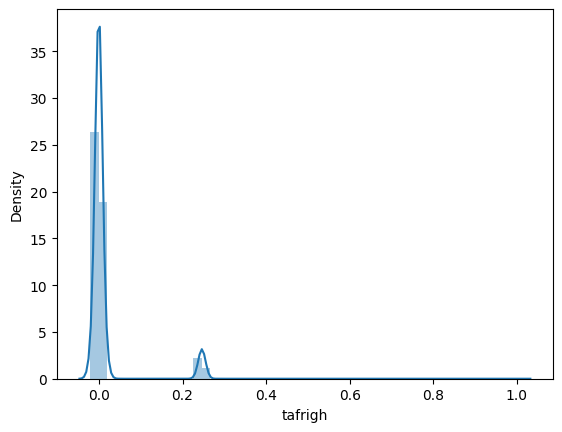

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sb
from scipy.stats import pearsonr
import numpy as np
import seaborn as sb
# 0: miyangin , 1: enheraf meyar , size: tedade adade random
#sample=np.random.normal(0,1,size=10000)
# size 1000 chon megdaresh ziyad hast, neshon dade nemishe.
#print("adade random: ",sample)
sb.distplot(e)
plt.show()

# obd_enginecoolanttemperature

In [ ]:
from sklearn.metrics import r2_score
u = X_validate2['obd_enginecoolanttemperature']
df_u = pd.DataFrame(u)
df_u['yhat']= df6['obd_enginecoolanttemperature']
r2 = r2_score(u, df_u['yhat'])
#mae = mean_absolute_error(u, df_u['yhat'])
df_u['tafrigh'] = u - df_u['yhat']

In [ ]:
r2

0.9258310673270927

In [ ]:
obd_enginecoolanttemperature1 = r2

In [ ]:
d= df_u
d


,obd_enginecoolanttemperature,yhat,tafrigh
0,0.792079,0.775246,0.016833
1,0.702970,0.759904,-0.056934
2,0.831683,0.851783,-0.020100
3,0.851485,0.870356,-0.018871
4,0.831683,0.906875,-0.075191
...,...,...,...
22116,0.000000,0.001588,-0.001588
22117,0.207921,0.722970,-0.515050
22118,0.000000,0.000430,-0.000430
22119,0.782178,0.768645,0.013534


In [ ]:
(abs(d ['tafrigh'].sort_values(ascending=False)).mean())+(3*(abs(d ['tafrigh'].sort_values(ascending=False)).std()))

0.26954765125284585

In [ ]:
abs(d ['tafrigh'].sort_values(ascending=False)).mean()

0.050820631533976375

In [ ]:
abs(d ['tafrigh'].sort_values(ascending=False)).std()

0.0729090065729565

In [ ]:
d ['tafrigh'].sort_values(ascending=False)

8815     0.636935
18095    0.601597
12556    0.593135
2247     0.592145
17328    0.589514
           ...   
14934   -0.568029
17573   -0.572495
13525   -0.576691
13938   -0.579975
16277   -0.587331
Name: tafrigh, Length: 22121, dtype: float64

In [ ]:
e=d ['tafrigh']
e

0        0.016833
1       -0.056934
2       -0.020100
3       -0.018871
4       -0.075191
           ...   
22116   -0.001588
22117   -0.515050
22118   -0.000430
22119    0.013534
22120    0.056929
Name: tafrigh, Length: 22121, dtype: float64

<ipython-input-106-50b89cb75ce2>:12: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sb.distplot(e)


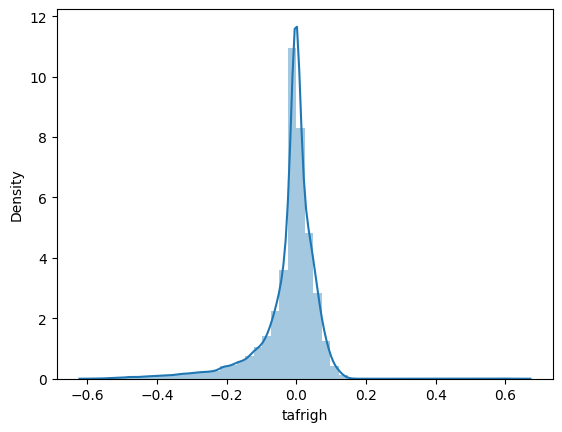

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sb
from scipy.stats import pearsonr
import numpy as np
import seaborn as sb
# 0: miyangin , 1: enheraf meyar , size: tedade adade random
#sample=np.random.normal(0,1,size=10000)
# size 1000 chon megdaresh ziyad hast, neshon dade nemishe.
#print("adade random: ",sample)
sb.distplot(e)
plt.show()

# obd_intakemanifoldabsolutepressure

In [ ]:
from sklearn.metrics import r2_score
u = X_validate2['obd_intakemanifoldabsolutepressure']
df_u = pd.DataFrame(u)
df_u['yhat']= df6['obd_intakemanifoldabsolutepressure']
r2 = r2_score(u, df_u['yhat'])
#mae = mean_absolute_error(u, df_u['yhat'])
df_u['tafrigh'] = u - df_u['yhat']

In [ ]:
r2

0.9981877271896529

In [ ]:
obd_intakemanifoldabsolutepressure1 = r2

In [ ]:
d= df_u
d


,obd_intakemanifoldabsolutepressure,yhat,tafrigh
0,0.236693,0.235451,0.001242
1,0.530011,0.528257,0.001754
2,0.293318,0.294323,-0.001004
3,0.483579,0.477906,0.005673
4,0.267271,0.272093,-0.004822
...,...,...,...
22116,0.000000,-0.002315,0.002315
22117,0.322763,0.327773,-0.005010
22118,0.000000,-0.000977,0.000977
22119,0.637599,0.634183,0.003416


In [ ]:
(abs(d ['tafrigh'].sort_values(ascending=False)).mean())+(3*(abs(d ['tafrigh'].sort_values(ascending=False)).std()))

0.03295377435703583

In [ ]:
abs(d ['tafrigh'].sort_values(ascending=False)).mean()

0.006148105900023272

In [ ]:
abs(d ['tafrigh'].sort_values(ascending=False)).std()

0.008935222819004185

In [ ]:
d ['tafrigh'].sort_values(ascending=False)

2749     0.305388
7009     0.234622
904      0.220763
14756    0.219180
31       0.216398
           ...   
16455   -0.096251
9920    -0.099650
19876   -0.125544
5851    -0.137041
7150    -0.152239
Name: tafrigh, Length: 22121, dtype: float64

In [ ]:
e=d ['tafrigh']
e

0        0.001242
1        0.001754
2       -0.001004
3        0.005673
4       -0.004822
           ...   
22116    0.002315
22117   -0.005010
22118    0.000977
22119    0.003416
22120    0.007828
Name: tafrigh, Length: 22121, dtype: float64

<ipython-input-116-50b89cb75ce2>:12: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sb.distplot(e)


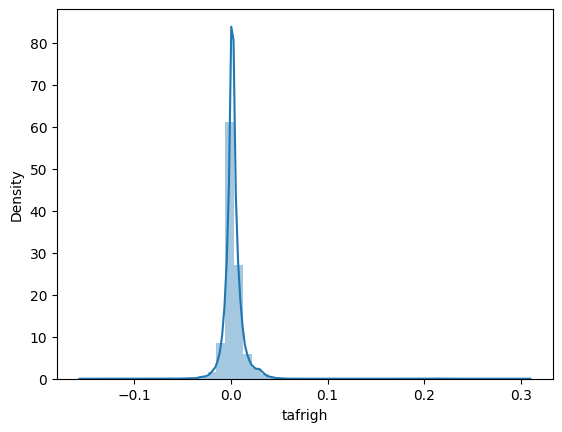

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sb
from scipy.stats import pearsonr
import numpy as np
import seaborn as sb
# 0: miyangin , 1: enheraf meyar , size: tedade adade random
#sample=np.random.normal(0,1,size=10000)
# size 1000 chon megdaresh ziyad hast, neshon dade nemishe.
#print("adade random: ",sample)
sb.distplot(e)
plt.show()

# obd_intakeairtemperature

In [ ]:
from sklearn.metrics import r2_score
u = X_validate2['obd_intakeairtemperature']
df_u = pd.DataFrame(u)
df_u['yhat']= df6['obd_intakeairtemperature']
r2 = r2_score(u, df_u['yhat'])
#mae = mean_absolute_error(u, df_u['yhat'])
df_u['tafrigh'] = u - df_u['yhat']

In [ ]:
r2

0.9983686289152239

In [ ]:
obd_intakeairtemperature1= r2

In [ ]:
d= df_u
d


,obd_intakeairtemperature,yhat,tafrigh
0,0.269663,0.268005,0.001658
1,0.325843,0.318107,0.007736
2,0.606742,0.606120,0.000621
3,0.707865,0.704951,0.002915
4,0.764045,0.754871,0.009174
...,...,...,...
22116,0.000000,-0.004114,0.004114
22117,0.213483,0.162462,0.051021
22118,0.000000,-0.001310,0.001310
22119,0.359551,0.359074,0.000477


In [ ]:
(abs(d ['tafrigh'].sort_values(ascending=False)).mean())+(3*(abs(d ['tafrigh'].sort_values(ascending=False)).std()))

0.02982751316184247

In [ ]:
abs(d ['tafrigh'].sort_values(ascending=False)).mean()

0.006284428309409954

In [ ]:
abs(d ['tafrigh'].sort_values(ascending=False)).std()

0.007847694950810839

In [ ]:
d ['tafrigh'].sort_values(ascending=False)

1834     0.068667
21480    0.064144
19630    0.061628
20985    0.061252
16727    0.060239
           ...   
10904   -0.076765
2247    -0.080966
17328   -0.082599
8815    -0.086695
543     -0.092332
Name: tafrigh, Length: 22121, dtype: float64

In [ ]:
e=d ['tafrigh']
e

0        0.001658
1        0.007736
2        0.000621
3        0.002915
4        0.009174
           ...   
22116    0.004114
22117    0.051021
22118    0.001310
22119    0.000477
22120   -0.002169
Name: tafrigh, Length: 22121, dtype: float64

<ipython-input-126-50b89cb75ce2>:12: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sb.distplot(e)


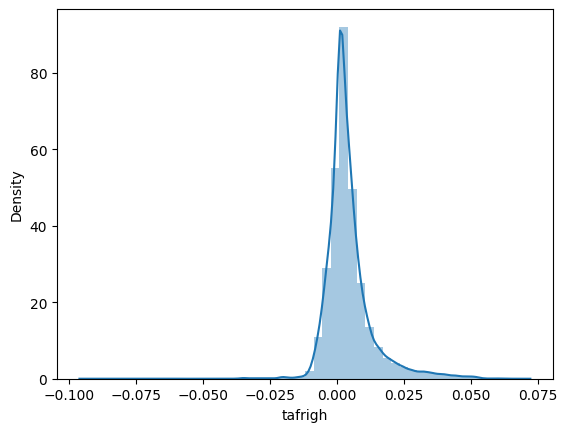

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sb
from scipy.stats import pearsonr
import numpy as np
import seaborn as sb
# 0: miyangin , 1: enheraf meyar , size: tedade adade random
#sample=np.random.normal(0,1,size=10000)
# size 1000 chon megdaresh ziyad hast, neshon dade nemishe.
#print("adade random: ",sample)
sb.distplot(e)
plt.show()

# obd_calculatedengineload

In [ ]:
from sklearn.metrics import r2_score
u = X_validate2['obd_calculatedengineload']
df_u = pd.DataFrame(u)
df_u['yhat']= df6['obd_calculatedengineload']
r2 = r2_score(u, df_u['yhat'])
#mae = mean_absolute_error(u, df_u['yhat'])
df_u['tafrigh'] = u - df_u['yhat']

In [ ]:
r2

0.17451376853210154

In [ ]:
obd_calculatedengineload1 = r2

In [ ]:
d= df_u
d


,obd_calculatedengineload,yhat,tafrigh
0,0.211765,0.203596,0.008169
1,0.568627,0.568315,0.000313
2,0.254902,0.270354,-0.015452
3,0.501961,0.496838,0.005123
4,0.239216,0.241994,-0.002778
...,...,...,...
22116,0.000000,-0.000064,0.000064
22117,0.329412,0.322408,0.007004
22118,0.000000,-0.000547,0.000547
22119,0.694118,0.695259,-0.001141


In [ ]:
(abs(d ['tafrigh'].sort_values(ascending=False)).mean())+(3*(abs(d ['tafrigh'].sort_values(ascending=False)).std()))

0.707656045400163

In [ ]:
abs(d ['tafrigh'].sort_values(ascending=False)).mean()

0.06125638512682113

In [ ]:
abs(d ['tafrigh'].sort_values(ascending=False)).std()

0.21546655342444732

In [ ]:
d ['tafrigh'].sort_values(ascending=False)

17328    0.236244
2247     0.201889
7628     0.101434
9561     0.092923
12952    0.088679
           ...   
9920    -1.055473
16455   -1.081184
10291   -1.088283
19876   -1.130628
7150    -1.184820
Name: tafrigh, Length: 22121, dtype: float64

In [ ]:
e=d ['tafrigh']
e

0        0.008169
1        0.000313
2       -0.015452
3        0.005123
4       -0.002778
           ...   
22116    0.000064
22117    0.007004
22118    0.000547
22119   -0.001141
22120    0.004939
Name: tafrigh, Length: 22121, dtype: float64

<ipython-input-136-50b89cb75ce2>:12: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sb.distplot(e)


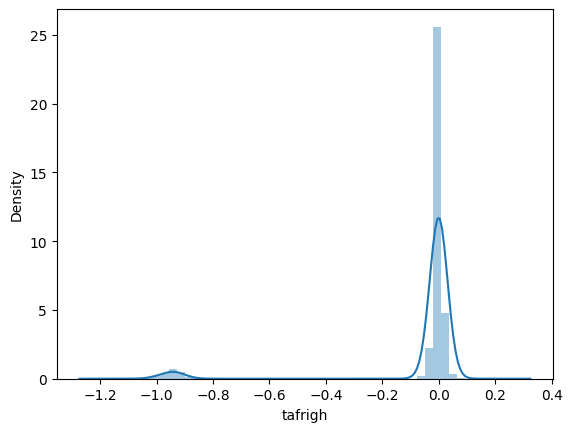

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sb
from scipy.stats import pearsonr
import numpy as np
import seaborn as sb
# 0: miyangin , 1: enheraf meyar , size: tedade adade random
#sample=np.random.normal(0,1,size=10000)
# size 1000 chon megdaresh ziyad hast, neshon dade nemishe.
#print("adade random: ",sample)
sb.distplot(e)
plt.show()

# obd_tpssensorvoltage

In [ ]:
from sklearn.metrics import r2_score
u = X_validate2['obd_tpssensorvoltage']
df_u = pd.DataFrame(u)
df_u['yhat']= df6['obd_tpssensorvoltage']
r2 = r2_score(u, df_u['yhat'])
#mae = mean_absolute_error(u, df_u['yhat'])
df_u['tafrigh'] = u - df_u['yhat']

In [ ]:
r2

0.8852851553204085

In [ ]:
obd_tpssensorvoltage1 = r2

In [ ]:
d= df_u
d


,obd_tpssensorvoltage,yhat,tafrigh
0,0.100753,0.093741,0.007012
1,0.222605,0.230329,-0.007724
2,0.096448,0.088700,0.007748
3,0.176319,0.181194,-0.004875
4,0.100753,0.096541,0.004212
...,...,...,...
22116,0.096448,0.023386,0.073062
22117,0.100753,0.114000,-0.013246
22118,0.000000,0.001640,-0.001640
22119,0.214209,0.245228,-0.031019


In [ ]:
(abs(d ['tafrigh'].sort_values(ascending=False)).mean())+(3*(abs(d ['tafrigh'].sort_values(ascending=False)).std()))

0.10332136320969149

In [ ]:
abs(d ['tafrigh'].sort_values(ascending=False)).mean()

0.019246925313970133

In [ ]:
abs(d ['tafrigh'].sort_values(ascending=False)).std()

0.028024812631907117

In [ ]:
d ['tafrigh'].sort_values(ascending=False)

7150     0.572669
19876    0.434202
16455    0.376831
5851     0.367508
9920     0.359777
           ...   
1106    -0.120449
10480   -0.120631
16174   -0.121669
8746    -0.124459
4340    -0.134902
Name: tafrigh, Length: 22121, dtype: float64

In [ ]:
e=d ['tafrigh']
e

0        0.007012
1       -0.007724
2        0.007748
3       -0.004875
4        0.004212
           ...   
22116    0.073062
22117   -0.013246
22118   -0.001640
22119   -0.031019
22120    0.007940
Name: tafrigh, Length: 22121, dtype: float64

<ipython-input-146-50b89cb75ce2>:12: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sb.distplot(e)


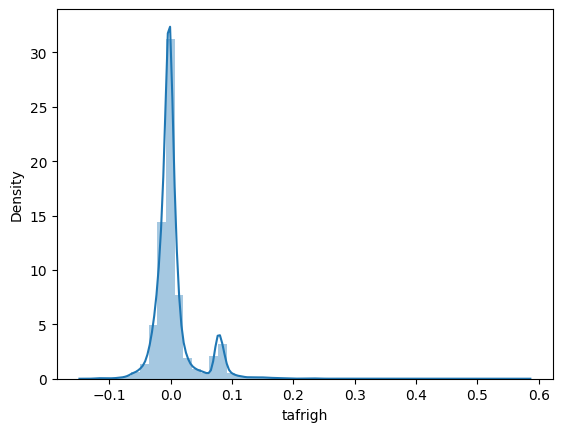

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sb
from scipy.stats import pearsonr
import numpy as np
import seaborn as sb
# 0: miyangin , 1: enheraf meyar , size: tedade adade random
#sample=np.random.normal(0,1,size=10000)
# size 1000 chon megdaresh ziyad hast, neshon dade nemishe.
#print("adade random: ",sample)
sb.distplot(e)
plt.show()

# obd_canistervalve

In [ ]:
from sklearn.metrics import r2_score
u = X_validate2['obd_canistervalve']
df_u = pd.DataFrame(u)
df_u['yhat']= df6['obd_canistervalve']
r2 = r2_score(u, df_u['yhat'])
#mae = mean_absolute_error(u, df_u['yhat'])
df_u['tafrigh'] = u - df_u['yhat']

In [ ]:
r2

0.9998614268395005

In [ ]:
obd_canistervalve1 = r2

In [ ]:
d= df_u
d


,obd_canistervalve,yhat,tafrigh
0,0.777778,0.775853,0.001925
1,0.444444,0.444047,0.000397
2,0.000000,0.002708,-0.002708
3,0.888889,0.886862,0.002026
4,0.000000,-0.002097,0.002097
...,...,...,...
22116,0.777778,0.776712,0.001066
22117,0.444444,0.441738,0.002707
22118,0.000000,-0.000894,0.000894
22119,0.777778,0.776695,0.001083


In [ ]:
(abs(d ['tafrigh'].sort_values(ascending=False)).mean())+(3*(abs(d ['tafrigh'].sort_values(ascending=False)).std()))

0.012402161413537166

In [ ]:
abs(d ['tafrigh'].sort_values(ascending=False)).mean()

0.002257385256986924

In [ ]:
abs(d ['tafrigh'].sort_values(ascending=False)).std()

0.0033815920521834144

In [ ]:
d ['tafrigh'].sort_values(ascending=False)

543      0.065904
12312    0.060022
2723     0.052237
12701    0.052237
19433    0.045614
           ...   
4666    -0.047904
729     -0.048089
10904   -0.048248
21250   -0.050476
2749    -0.057793
Name: tafrigh, Length: 22121, dtype: float64

In [ ]:
e=d ['tafrigh']
e

0        0.001925
1        0.000397
2       -0.002708
3        0.002026
4        0.002097
           ...   
22116    0.001066
22117    0.002707
22118    0.000894
22119    0.001083
22120    0.001343
Name: tafrigh, Length: 22121, dtype: float64

<ipython-input-156-50b89cb75ce2>:12: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sb.distplot(e)


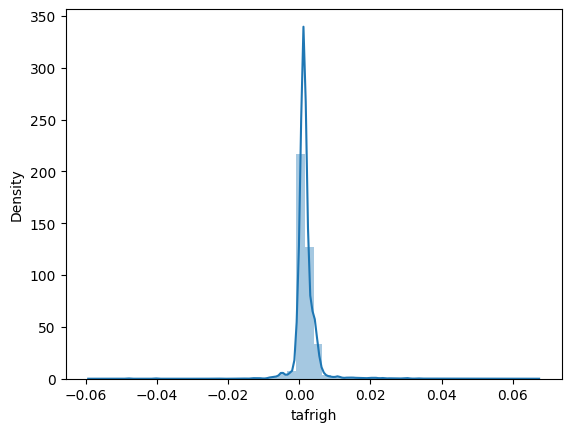

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sb
from scipy.stats import pearsonr
import numpy as np
import seaborn as sb
# 0: miyangin , 1: enheraf meyar , size: tedade adade random
#sample=np.random.normal(0,1,size=10000)
# size 1000 chon megdaresh ziyad hast, neshon dade nemishe.
#print("adade random: ",sample)
sb.distplot(e)
plt.show()

# obd_tpssensorvoltage

In [ ]:
from sklearn.metrics import r2_score
u = X_validate2['obd_tpssensorvoltage']
df_u = pd.DataFrame(u)
df_u['yhat']= df6['obd_tpssensorvoltage']
r2 = r2_score(u, df_u['yhat'])
#mae = mean_absolute_error(u, df_u['yhat'])
df_u['tafrigh'] = u - df_u['yhat']

In [ ]:
r2

0.8852851553204085

In [ ]:
obd_tpssensorvoltage1 = r2

In [ ]:
d= df_u
d


,obd_tpssensorvoltage,yhat,tafrigh
0,0.100753,0.093741,0.007012
1,0.222605,0.230329,-0.007724
2,0.096448,0.088700,0.007748
3,0.176319,0.181194,-0.004875
4,0.100753,0.096541,0.004212
...,...,...,...
22116,0.096448,0.023386,0.073062
22117,0.100753,0.114000,-0.013246
22118,0.000000,0.001640,-0.001640
22119,0.214209,0.245228,-0.031019


In [ ]:
(abs(d ['tafrigh'].sort_values(ascending=False)).mean())+(3*(abs(d ['tafrigh'].sort_values(ascending=False)).std()))

0.10332136320969149

In [ ]:
abs(d ['tafrigh'].sort_values(ascending=False)).mean()

0.019246925313970133

In [ ]:
abs(d ['tafrigh'].sort_values(ascending=False)).std()

0.028024812631907117

In [ ]:
d ['tafrigh'].sort_values(ascending=False)

7150     0.572669
19876    0.434202
16455    0.376831
5851     0.367508
9920     0.359777
           ...   
1106    -0.120449
10480   -0.120631
16174   -0.121669
8746    -0.124459
4340    -0.134902
Name: tafrigh, Length: 22121, dtype: float64

In [ ]:
e=d ['tafrigh']
e

0        0.007012
1       -0.007724
2        0.007748
3       -0.004875
4        0.004212
           ...   
22116    0.073062
22117   -0.013246
22118   -0.001640
22119   -0.031019
22120    0.007940
Name: tafrigh, Length: 22121, dtype: float64

<ipython-input-166-50b89cb75ce2>:12: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sb.distplot(e)


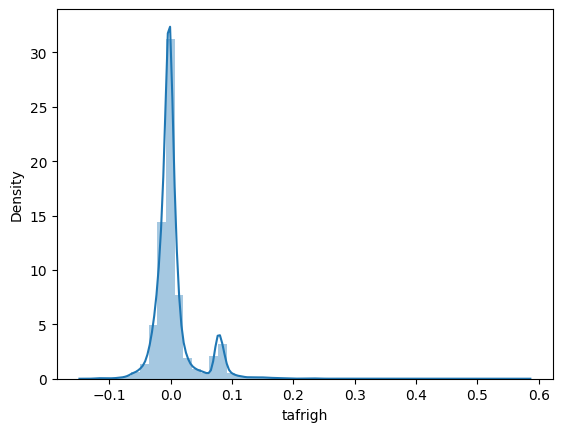

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sb
from scipy.stats import pearsonr
import numpy as np
import seaborn as sb
# 0: miyangin , 1: enheraf meyar , size: tedade adade random
#sample=np.random.normal(0,1,size=10000)
# size 1000 chon megdaresh ziyad hast, neshon dade nemishe.
#print("adade random: ",sample)
sb.distplot(e)
plt.show()

# obd_downstreamo2sensorvoltage

In [ ]:
from sklearn.metrics import r2_score
u = X_validate2['obd_downstreamo2sensorvoltage']
df_u = pd.DataFrame(u)
df_u['yhat']= df6['obd_downstreamo2sensorvoltage']
r2 = r2_score(u, df_u['yhat'])
#mae = mean_absolute_error(u, df_u['yhat'])
df_u['tafrigh'] = u - df_u['yhat']

In [ ]:
r2

0.9998090608331867

In [ ]:
obd_downstreamo2sensorvoltage1 = r2

In [ ]:
d= df_u
d


,obd_downstreamo2sensorvoltage,yhat,tafrigh
0,0.114155,0.112444,0.001712
1,0.551598,0.551255,0.000343
2,0.566210,0.566624,-0.000414
3,0.209132,0.208043,0.001089
4,0.401826,0.401315,0.000511
...,...,...,...
22116,0.601826,0.602808,-0.000982
22117,0.397260,0.394820,0.002441
22118,0.000000,-0.000407,0.000407
22119,0.515982,0.515245,0.000737


In [ ]:
(abs(d ['tafrigh'].sort_values(ascending=False)).mean())+(3*(abs(d ['tafrigh'].sort_values(ascending=False)).std()))

0.011517762188567263

In [ ]:
abs(d ['tafrigh'].sort_values(ascending=False)).mean()

0.0017362764170320054

In [ ]:
abs(d ['tafrigh'].sort_values(ascending=False)).std()

0.003260495257178419

In [ ]:
d ['tafrigh'].sort_values(ascending=False)

543      0.131006
21250    0.086467
12312    0.078924
17064    0.077124
4666     0.074831
           ...   
881     -0.020104
3571    -0.020104
14421   -0.042329
2749    -0.053039
10904   -0.071163
Name: tafrigh, Length: 22121, dtype: float64

In [ ]:
e=d ['tafrigh']
e

0        0.001712
1        0.000343
2       -0.000414
3        0.001089
4        0.000511
           ...   
22116   -0.000982
22117    0.002441
22118    0.000407
22119    0.000737
22120    0.000091
Name: tafrigh, Length: 22121, dtype: float64

<ipython-input-176-50b89cb75ce2>:12: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sb.distplot(e)


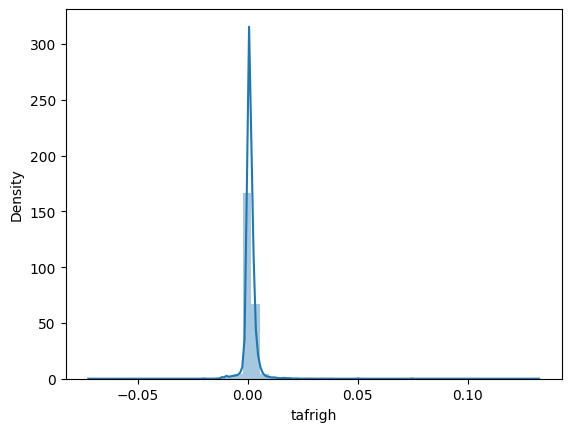

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sb
from scipy.stats import pearsonr
import numpy as np
import seaborn as sb
# 0: miyangin , 1: enheraf meyar , size: tedade adade random
#sample=np.random.normal(0,1,size=10000)
# size 1000 chon megdaresh ziyad hast, neshon dade nemishe.
#print("adade random: ",sample)
sb.distplot(e)
plt.show()

# ignition

In [ ]:
from sklearn.metrics import r2_score
u = X_validate2['ignition']
df_u = pd.DataFrame(u)
df_u['yhat']= df6['ignition']
r2 = r2_score(u, df_u['yhat'])
#mae = mean_absolute_error(u, df_u['yhat'])
df_u['tafrigh'] = u - df_u['yhat']

In [ ]:
r2

0.9999580485966594

In [ ]:
ignition1 = r2

In [ ]:
d= df_u
d


,ignition,yhat,tafrigh
0,1.0,0.999481,0.000519
1,1.0,0.999265,0.000735
2,0.0,-0.007325,0.007325
3,1.0,0.997720,0.002280
4,1.0,0.998301,0.001699
...,...,...,...
22116,1.0,0.998908,0.001092
22117,1.0,0.998399,0.001601
22118,0.0,-0.000772,0.000772
22119,1.0,0.998915,0.001085


In [ ]:
(abs(d ['tafrigh'].sort_values(ascending=False)).mean())+(3*(abs(d ['tafrigh'].sort_values(ascending=False)).std()))

0.006913610179589682

In [ ]:
abs(d ['tafrigh'].sort_values(ascending=False)).mean()

0.0013316345906450016

In [ ]:
abs(d ['tafrigh'].sort_values(ascending=False)).std()

0.001860658529648227

In [ ]:
d ['tafrigh'].sort_values(ascending=False)

12312    0.047889
543      0.044638
15967    0.026890
20515    0.025279
4200     0.023100
           ...   
9370    -0.037377
12692   -0.037417
14734   -0.039503
18315   -0.042264
6370    -0.042706
Name: tafrigh, Length: 22121, dtype: float64

In [ ]:
e=d ['tafrigh']
e

0        0.000519
1        0.000735
2        0.007325
3        0.002280
4        0.001699
           ...   
22116    0.001092
22117    0.001601
22118    0.000772
22119    0.001085
22120    0.001559
Name: tafrigh, Length: 22121, dtype: float64

<ipython-input-186-50b89cb75ce2>:12: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sb.distplot(e)


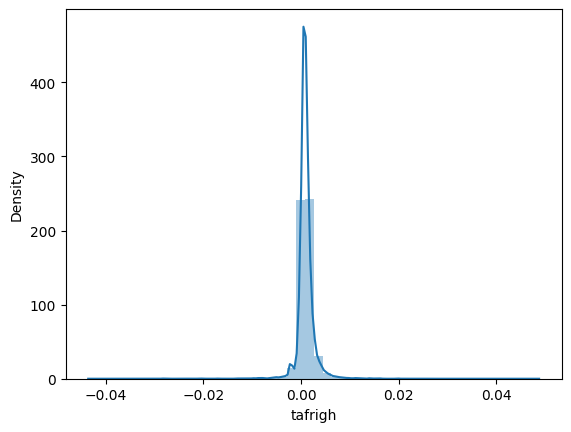

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sb
from scipy.stats import pearsonr
import numpy as np
import seaborn as sb
# 0: miyangin , 1: enheraf meyar , size: tedade adade random
#sample=np.random.normal(0,1,size=10000)
# size 1000 chon megdaresh ziyad hast, neshon dade nemishe.
#print("adade random: ",sample)
sb.distplot(e)
plt.show()

# obd_batteryvoltage

In [ ]:
from sklearn.metrics import r2_score
u = X_validate2['obd_batteryvoltage']
df_u = pd.DataFrame(u)
df_u['yhat']= df6['obd_batteryvoltage']
r2 = r2_score(u, df_u['yhat'])
#mae = mean_absolute_error(u, df_u['yhat'])
df_u['tafrigh'] = u - df_u['yhat']

In [ ]:
r2

0.9997930901940864

In [ ]:
obd_batteryvoltage1 = r2

In [ ]:
d= df_u
d


,obd_batteryvoltage,yhat,tafrigh
0,1.000000,0.999387,0.000613
1,0.928571,0.924303,0.004268
2,0.928571,0.930824,-0.002252
3,0.928571,0.926568,0.002004
4,0.928571,0.921440,0.007131
...,...,...,...
22116,0.000000,0.001022,-0.001022
22117,1.000000,0.973615,0.026385
22118,0.000000,-0.000993,0.000993
22119,0.928571,0.927543,0.001029


In [ ]:
(abs(d ['tafrigh'].sort_values(ascending=False)).mean())+(3*(abs(d ['tafrigh'].sort_values(ascending=False)).std()))

0.015392847136756012

In [ ]:
abs(d ['tafrigh'].sort_values(ascending=False)).mean()

0.0035356219683727913

In [ ]:
abs(d ['tafrigh'].sort_values(ascending=False)).std()

0.003952408389461074

In [ ]:
d ['tafrigh'].sort_values(ascending=False)

19004    0.036113
18363    0.033813
13525    0.033600
3763     0.033433
14934    0.033251
           ...   
8815    -0.039887
17328   -0.040772
2247    -0.042754
12556   -0.046351
18095   -0.049344
Name: tafrigh, Length: 22121, dtype: float64

In [ ]:
e=d ['tafrigh']
e

0        0.000613
1        0.004268
2       -0.002252
3        0.002004
4        0.007131
           ...   
22116   -0.001022
22117    0.026385
22118    0.000993
22119    0.001029
22120   -0.001522
Name: tafrigh, Length: 22121, dtype: float64

<ipython-input-196-50b89cb75ce2>:12: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sb.distplot(e)


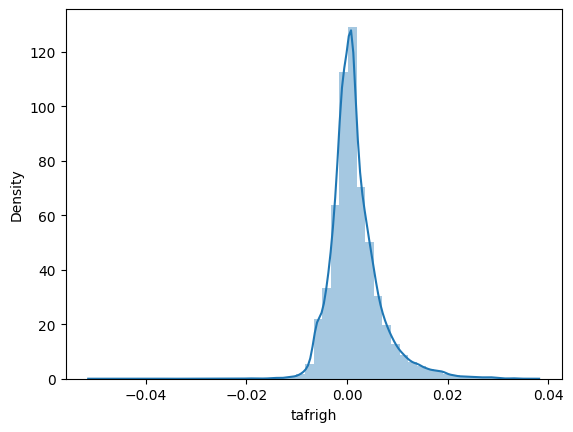

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sb
from scipy.stats import pearsonr
import numpy as np
import seaborn as sb
# 0: miyangin , 1: enheraf meyar , size: tedade adade random
#sample=np.random.normal(0,1,size=10000)
# size 1000 chon megdaresh ziyad hast, neshon dade nemishe.
#print("adade random: ",sample)
sb.distplot(e)
plt.show()

#speed

In [ ]:
from sklearn.metrics import r2_score
u = X_validate2['speed']
df_u = pd.DataFrame(u)
df_u['yhat']= df6['speed']
r2 = r2_score(u, df_u['yhat'])
#mae = mean_absolute_error(u, df_u['yhat'])
df_u['tafrigh'] = u - df_u['yhat']

In [ ]:
r2

0.9995848404527053

In [ ]:
speed1 = r2

In [ ]:
d= df_u
d


,speed,yhat,tafrigh
0,0.153285,0.147865,0.005420
1,0.489051,0.488363,0.000688
2,0.000000,-0.001870,0.001870
3,0.000000,-0.005818,0.005818
4,0.000000,-0.004194,0.004194
...,...,...,...
22116,0.000000,-0.002003,0.002003
22117,0.000000,-0.005118,0.005118
22118,0.000000,-0.001348,0.001348
22119,0.197080,0.193368,0.003712


In [ ]:
(abs(d ['tafrigh'].sort_values(ascending=False)).mean())+(3*(abs(d ['tafrigh'].sort_values(ascending=False)).std()))

0.010747852121408778

In [ ]:
abs(d ['tafrigh'].sort_values(ascending=False)).mean()

0.0032205461960446565

In [ ]:
abs(d ['tafrigh'].sort_values(ascending=False)).std()

0.002509101975121374

In [ ]:
d ['tafrigh'].sort_values(ascending=False)

543      0.107972
20344    0.076828
17064    0.044854
8211     0.035483
8248     0.035483
           ...   
17328   -0.040470
2247    -0.040788
8815    -0.045841
10904   -0.079331
2749    -0.107305
Name: tafrigh, Length: 22121, dtype: float64

In [ ]:
e=d ['tafrigh']
e

0        0.005420
1        0.000688
2        0.001870
3        0.005818
4        0.004194
           ...   
22116    0.002003
22117    0.005118
22118    0.001348
22119    0.003712
22120    0.002765
Name: tafrigh, Length: 22121, dtype: float64

<ipython-input-206-50b89cb75ce2>:12: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sb.distplot(e)


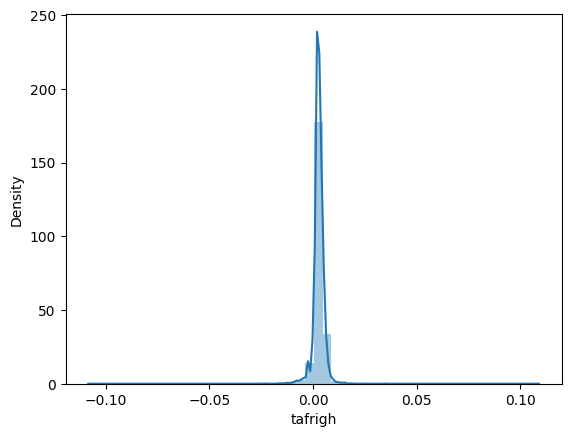

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sb
from scipy.stats import pearsonr
import numpy as np
import seaborn as sb
# 0: miyangin , 1: enheraf meyar , size: tedade adade random
#sample=np.random.normal(0,1,size=10000)
# size 1000 chon megdaresh ziyad hast, neshon dade nemishe.
#print("adade random: ",sample)
sb.distplot(e)
plt.show()

#obd_batteryvoltage

In [ ]:
from sklearn.metrics import r2_score
u = X_validate2['obd_batteryvoltage']
df_u = pd.DataFrame(u)
df_u['yhat']= df6['obd_batteryvoltage']
r2 = r2_score(u, df_u['yhat'])
#mae = mean_absolute_error(u, df_u['yhat'])
df_u['tafrigh'] = u - df_u['yhat']

In [ ]:
r2

0.9997930901940864

In [ ]:
obd_batteryvoltage1 = r2

In [ ]:
d= df_u
d


,obd_batteryvoltage,yhat,tafrigh
0,1.000000,0.999387,0.000613
1,0.928571,0.924303,0.004268
2,0.928571,0.930824,-0.002252
3,0.928571,0.926568,0.002004
4,0.928571,0.921440,0.007131
...,...,...,...
22116,0.000000,0.001022,-0.001022
22117,1.000000,0.973615,0.026385
22118,0.000000,-0.000993,0.000993
22119,0.928571,0.927543,0.001029


In [ ]:
(abs(d ['tafrigh'].sort_values(ascending=False)).mean())+(3*(abs(d ['tafrigh'].sort_values(ascending=False)).std()))

0.015392847136756012

In [ ]:
abs(d ['tafrigh'].sort_values(ascending=False)).mean()

0.0035356219683727913

In [ ]:
abs(d ['tafrigh'].sort_values(ascending=False)).std()

0.003952408389461074

In [ ]:
d ['tafrigh'].sort_values(ascending=False)

19004    0.036113
18363    0.033813
13525    0.033600
3763     0.033433
14934    0.033251
           ...   
8815    -0.039887
17328   -0.040772
2247    -0.042754
12556   -0.046351
18095   -0.049344
Name: tafrigh, Length: 22121, dtype: float64

In [ ]:
e=d ['tafrigh']
e

0        0.000613
1        0.004268
2       -0.002252
3        0.002004
4        0.007131
           ...   
22116   -0.001022
22117    0.026385
22118    0.000993
22119    0.001029
22120   -0.001522
Name: tafrigh, Length: 22121, dtype: float64

<ipython-input-216-50b89cb75ce2>:12: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sb.distplot(e)


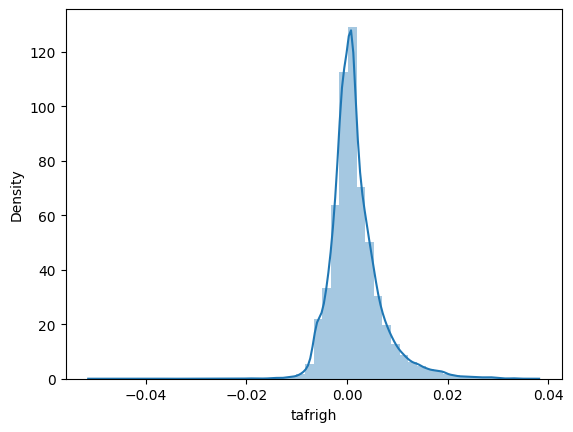

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sb
from scipy.stats import pearsonr
import numpy as np
import seaborn as sb
# 0: miyangin , 1: enheraf meyar , size: tedade adade random
#sample=np.random.normal(0,1,size=10000)
# size 1000 chon megdaresh ziyad hast, neshon dade nemishe.
#print("adade random: ",sample)
sb.distplot(e)
plt.show()

#movement

In [ ]:
from sklearn.metrics import r2_score
u = X_validate2['movement']
df_u = pd.DataFrame(u)
df_u['yhat']= df6['movement']
r2 = r2_score(u, df_u['yhat'])
#mae = mean_absolute_error(u, df_u['yhat'])
df_u['tafrigh'] = u - df_u['yhat']

In [ ]:
r2

0.9999576375151467

In [ ]:
movement1 = r2

In [ ]:
r2

0.9999576375151467

In [ ]:
d= df_u
d


,movement,yhat,tafrigh
0,1.0,0.999358,0.000642
1,1.0,0.999255,0.000745
2,0.0,-0.007268,0.007268
3,1.0,0.997854,0.002146
4,1.0,0.998286,0.001714
...,...,...,...
22116,1.0,0.998902,0.001098
22117,1.0,0.998277,0.001723
22118,0.0,-0.000796,0.000796
22119,1.0,0.998931,0.001069


In [ ]:
(abs(d ['tafrigh'].sort_values(ascending=False)).mean())+(3*(abs(d ['tafrigh'].sort_values(ascending=False)).std()))

0.006927641275162791

In [ ]:
abs(d ['tafrigh'].sort_values(ascending=False)).mean()

0.0013550633726176148

In [ ]:
abs(d ['tafrigh'].sort_values(ascending=False)).std()

0.0018575259675150588

In [ ]:
d ['tafrigh'].sort_values(ascending=False)

12312    0.047992
543      0.044811
15967    0.026990
20515    0.025376
4200     0.023184
           ...   
9370    -0.037388
12692   -0.037442
14734   -0.039520
18315   -0.042284
6370    -0.042735
Name: tafrigh, Length: 22121, dtype: float64

In [ ]:
e=d ['tafrigh']
e

0        0.000642
1        0.000745
2        0.007268
3        0.002146
4        0.001714
           ...   
22116    0.001098
22117    0.001723
22118    0.000796
22119    0.001069
22120    0.001577
Name: tafrigh, Length: 22121, dtype: float64

<ipython-input-269-50b89cb75ce2>:12: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sb.distplot(e)


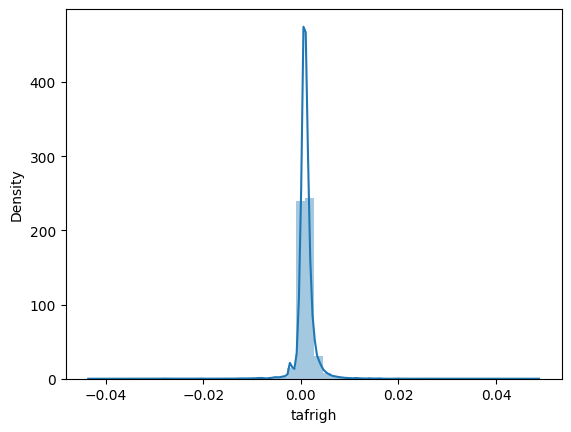

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sb
from scipy.stats import pearsonr
import numpy as np
import seaborn as sb
# 0: miyangin , 1: enheraf meyar , size: tedade adade random
#sample=np.random.normal(0,1,size=10000)
# size 1000 chon megdaresh ziyad hast, neshon dade nemishe.
#print("adade random: ",sample)
sb.distplot(e)
plt.show()

#speed

In [ ]:
from sklearn.metrics import r2_score
u = X_validate2['speed']
df_u = pd.DataFrame(u)
df_u['yhat']= df6['speed']
r2 = r2_score(u, df_u['yhat'])
#mae = mean_absolute_error(u, df_u['yhat'])
df_u['tafrigh'] = u - df_u['yhat']

In [ ]:
r2

0.9995848404527053

In [ ]:
speed1 = r2

In [ ]:
d= df_u
d


,speed,yhat,tafrigh
0,0.153285,0.147865,0.005420
1,0.489051,0.488363,0.000688
2,0.000000,-0.001870,0.001870
3,0.000000,-0.005818,0.005818
4,0.000000,-0.004194,0.004194
...,...,...,...
22116,0.000000,-0.002003,0.002003
22117,0.000000,-0.005118,0.005118
22118,0.000000,-0.001348,0.001348
22119,0.197080,0.193368,0.003712


In [ ]:
(abs(d ['tafrigh'].sort_values(ascending=False)).mean())+(3*(abs(d ['tafrigh'].sort_values(ascending=False)).std()))

0.010747852121408778

In [ ]:
abs(d ['tafrigh'].sort_values(ascending=False)).mean()

0.0032205461960446565

In [ ]:
abs(d ['tafrigh'].sort_values(ascending=False)).std()

0.002509101975121374

In [ ]:
d ['tafrigh'].sort_values(ascending=False)

543      0.107972
20344    0.076828
17064    0.044854
8211     0.035483
8248     0.035483
           ...   
17328   -0.040470
2247    -0.040788
8815    -0.045841
10904   -0.079331
2749    -0.107305
Name: tafrigh, Length: 22121, dtype: float64

In [ ]:
e=d ['tafrigh']
e

0        0.005420
1        0.000688
2        0.001870
3        0.005818
4        0.004194
           ...   
22116    0.002003
22117    0.005118
22118    0.001348
22119    0.003712
22120    0.002765
Name: tafrigh, Length: 22121, dtype: float64

<ipython-input-237-50b89cb75ce2>:12: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sb.distplot(e)


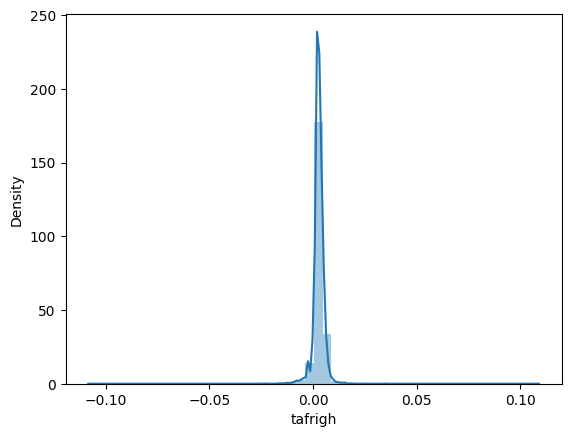

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sb
from scipy.stats import pearsonr
import numpy as np
import seaborn as sb
# 0: miyangin , 1: enheraf meyar , size: tedade adade random
#sample=np.random.normal(0,1,size=10000)
# size 1000 chon megdaresh ziyad hast, neshon dade nemishe.
#print("adade random: ",sample)
sb.distplot(e)
plt.show()

# engineontime

In [ ]:
from sklearn.metrics import r2_score
u = X_validate2['engineontime']
df_u = pd.DataFrame(u)
df_u['yhat']= df6['engineontime']
r2 = r2_score(u, df_u['yhat'])
#mae = mean_absolute_error(u, df_u['yhat'])
df_u['tafrigh'] = u - df_u['yhat']

In [ ]:
r2

0.9996483035992301

In [ ]:
engineontime1 = r2

In [ ]:
d= df_u
d


,engineontime,yhat,tafrigh
0,0.049787,0.049212,0.000575
1,0.449324,0.443406,0.005918
2,0.629260,0.625249,0.004010
3,0.843109,0.842340,0.000770
4,0.486769,0.482897,0.003873
...,...,...,...
22116,0.935889,0.933743,0.002146
22117,0.389792,0.393243,-0.003451
22118,0.421673,0.420657,0.001016
22119,0.358069,0.355875,0.002195


In [ ]:
(abs(d ['tafrigh'].sort_values(ascending=False)).mean())+(3*(abs(d ['tafrigh'].sort_values(ascending=False)).std()))

0.014130618119842077

In [ ]:
abs(d ['tafrigh'].sort_values(ascending=False)).mean()

0.003387823185488798

In [ ]:
abs(d ['tafrigh'].sort_values(ascending=False)).std()

0.0035809316447844262

In [ ]:
d ['tafrigh'].sort_values(ascending=False)

17328    0.092417
8815     0.091117
2247     0.089985
12556    0.072135
10904    0.071486
           ...   
8211    -0.052368
16790   -0.052368
543     -0.059178
20344   -0.059222
14421   -0.100841
Name: tafrigh, Length: 22121, dtype: float64

In [ ]:
e=d ['tafrigh']
e

0        0.000575
1        0.005918
2        0.004010
3        0.000770
4        0.003873
           ...   
22116    0.002146
22117   -0.003451
22118    0.001016
22119    0.002195
22120    0.002162
Name: tafrigh, Length: 22121, dtype: float64

<ipython-input-247-50b89cb75ce2>:12: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sb.distplot(e)


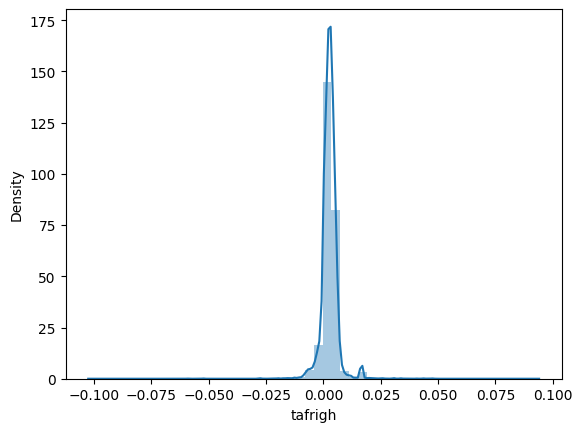

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sb
from scipy.stats import pearsonr
import numpy as np
import seaborn as sb
# 0: miyangin , 1: enheraf meyar , size: tedade adade random
#sample=np.random.normal(0,1,size=10000)
# size 1000 chon megdaresh ziyad hast, neshon dade nemishe.
#print("adade random: ",sample)
sb.distplot(e)
plt.show()

In [ ]:
from sklearn.metrics import r2_score
u = X_validate2['obd_upstreamo2sensorvoltage']
df_u = pd.DataFrame(u)
df_u['yhat']= df6['obd_upstreamo2sensorvoltage']
r2 = r2_score(u, df_u['yhat'])
#mae = mean_absolute_error(u, df_u['yhat'])
df_u['tafrigh'] = u - df_u['yhat']

In [ ]:
r2

0.9999623900423503

In [ ]:
obd_upstreamo2sensorvoltage1 = r2

In [ ]:
d= df_u
d


,obd_upstreamo2sensorvoltage,yhat,tafrigh
0,0.823171,0.824348,-0.001177
1,0.818089,0.819387,-0.001297
2,0.650407,0.654096,-0.003690
3,0.853659,0.854668,-0.001009
4,0.872967,0.874550,-0.001582
...,...,...,...
22116,0.685976,0.686273,-0.000297
22117,0.405488,0.404945,0.000543
22118,0.000000,0.000435,-0.000435
22119,0.838415,0.839124,-0.000709


In [ ]:
(abs(d ['tafrigh'].sort_values(ascending=False)).mean())+(3*(abs(d ['tafrigh'].sort_values(ascending=False)).std()))

0.006783119363395389

In [ ]:
abs(d ['tafrigh'].sort_values(ascending=False)).mean()

0.001283613601118362

In [ ]:
abs(d ['tafrigh'].sort_values(ascending=False)).std()

0.0018331685874256756

In [ ]:
d ['tafrigh'].sort_values(ascending=False)

20344    0.021004
2723     0.020427
12701    0.020427
8255     0.019426
853      0.019407
           ...   
20569   -0.025093
20515   -0.026121
16174   -0.030384
6848    -0.033593
9145    -0.035166
Name: tafrigh, Length: 22121, dtype: float64

In [ ]:
e=d ['tafrigh']
e

0       -0.001177
1       -0.001297
2       -0.003690
3       -0.001009
4       -0.001582
           ...   
22116   -0.000297
22117    0.000543
22118   -0.000435
22119   -0.000709
22120   -0.000930
Name: tafrigh, Length: 22121, dtype: float64

<ipython-input-279-50b89cb75ce2>:12: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sb.distplot(e)


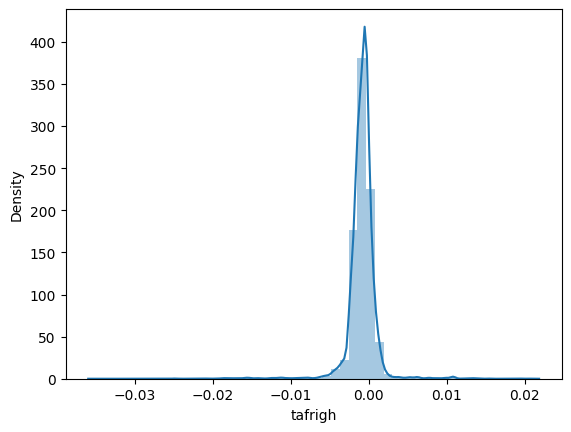

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sb
from scipy.stats import pearsonr
import numpy as np
import seaborn as sb
# 0: miyangin , 1: enheraf meyar , size: tedade adade random
#sample=np.random.normal(0,1,size=10000)
# size 1000 chon megdaresh ziyad hast, neshon dade nemishe.
#print("adade random: ",sample)
sb.distplot(e)
plt.show()

# obd_airconditioningstatus

In [ ]:
from sklearn.metrics import r2_score
u = X_validate2['obd_airconditioningstatus']
df_u = pd.DataFrame(u)
df_u['yhat']= df6['obd_airconditioningstatus']
r2 = r2_score(u, df_u['yhat'])
#mae = mean_absolute_error(u, df_u['yhat'])
df_u['tafrigh'] = u - df_u['yhat']

In [ ]:
r2

0.9998301350229838

In [ ]:
obd_upstreamo2sensorvoltage1 = r2

In [ ]:
d= df_u
d


,obd_airconditioningstatus,yhat,tafrigh
0,0.000000,-0.003405,0.003405
1,0.000000,-0.002787,0.002787
2,0.000000,0.000452,-0.000452
3,0.066667,0.064466,0.002201
4,0.066667,0.064840,0.001827
...,...,...,...
22116,0.000000,-0.001463,0.001463
22117,0.000000,-0.001634,0.001634
22118,0.000000,-0.000285,0.000285
22119,0.000000,-0.002932,0.002932


In [ ]:
(abs(d ['tafrigh'].sort_values(ascending=False)).mean())+(3*(abs(d ['tafrigh'].sort_values(ascending=False)).std()))

0.012634697136352548

In [ ]:
abs(d ['tafrigh'].sort_values(ascending=False)).mean()

0.0020744809994161294

In [ ]:
abs(d ['tafrigh'].sort_values(ascending=False)).std()

0.0035200720456454726

In [ ]:
d ['tafrigh'].sort_values(ascending=False)

543      0.149907
12312    0.086242
20998    0.085946
13373    0.084523
6370     0.079173
           ...   
2247    -0.021925
12556   -0.023129
7200    -0.023265
9561    -0.023318
18095   -0.027066
Name: tafrigh, Length: 22121, dtype: float64

In [ ]:
e=d ['tafrigh']
e

0        0.003405
1        0.002787
2       -0.000452
3        0.002201
4        0.001827
           ...   
22116    0.001463
22117    0.001634
22118    0.000285
22119    0.002932
22120    0.002206
Name: tafrigh, Length: 22121, dtype: float64

<ipython-input-289-50b89cb75ce2>:12: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sb.distplot(e)


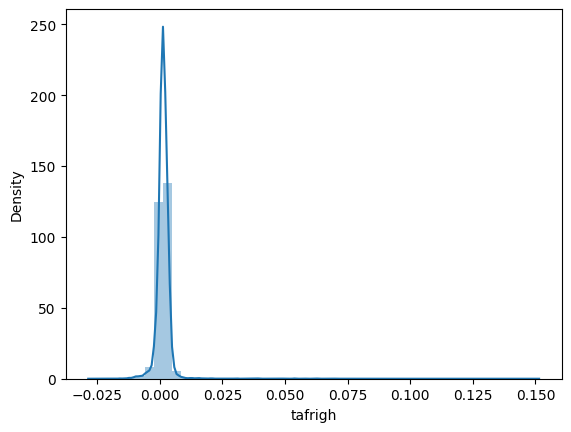

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sb
from scipy.stats import pearsonr
import numpy as np
import seaborn as sb
# 0: miyangin , 1: enheraf meyar , size: tedade adade random
#sample=np.random.normal(0,1,size=10000)
# size 1000 chon megdaresh ziyad hast, neshon dade nemishe.
#print("adade random: ",sample)
sb.distplot(e)
plt.show()

# obd_batteryvoltage

In [ ]:
from sklearn.metrics import r2_score
u = X_validate2['obd_sparkadvance']
df_u = pd.DataFrame(u)
df_u['yhat']= df6['obd_sparkadvance']
r2 = r2_score(u, df_u['yhat'])
#mae = mean_absolute_error(u, df_u['yhat'])
df_u['tafrigh'] = u - df_u['yhat']

In [ ]:
r2

0.9998748554325049

In [ ]:
obd_upstreamo2sensorvoltage1 = r2

In [ ]:
d= df_u
d


,obd_sparkadvance,yhat,tafrigh
0,0.128205,0.127203,0.001002
1,0.820513,0.819271,0.001242
2,0.179487,0.174746,0.004741
3,0.692308,0.692518,-0.000210
4,0.384615,0.382149,0.002466
...,...,...,...
22116,0.128205,0.128412,-0.000206
22117,0.205128,0.202490,0.002638
22118,0.000000,0.000223,-0.000223
22119,0.615385,0.616611,-0.001226


In [ ]:
(abs(d ['tafrigh'].sort_values(ascending=False)).mean())+(3*(abs(d ['tafrigh'].sort_values(ascending=False)).std()))

0.010132383181920423

In [ ]:
abs(d ['tafrigh'].sort_values(ascending=False)).mean()

0.0016107983321501074

In [ ]:
abs(d ['tafrigh'].sort_values(ascending=False)).std()

0.0028405282832567715

In [ ]:
d ['tafrigh'].sort_values(ascending=False)

543      0.121638
10904    0.103191
2749     0.085898
8815     0.069349
17328    0.067315
           ...   
9163    -0.027500
14734   -0.029524
9370    -0.031187
6370    -0.031545
18315   -0.032522
Name: tafrigh, Length: 22121, dtype: float64

In [ ]:
e=d ['tafrigh']
e

0        0.001002
1        0.001242
2        0.004741
3       -0.000210
4        0.002466
           ...   
22116   -0.000206
22117    0.002638
22118   -0.000223
22119   -0.001226
22120   -0.000251
Name: tafrigh, Length: 22121, dtype: float64

<ipython-input-302-50b89cb75ce2>:12: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sb.distplot(e)


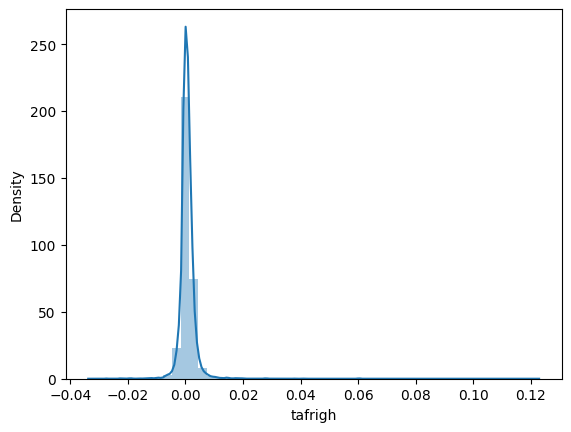

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sb
from scipy.stats import pearsonr
import numpy as np
import seaborn as sb
# 0: miyangin , 1: enheraf meyar , size: tedade adade random
#sample=np.random.normal(0,1,size=10000)
# size 1000 chon megdaresh ziyad hast, neshon dade nemishe.
#print("adade random: ",sample)
sb.distplot(e)
plt.show()

In [ ]:
engineontime

# engineontime

In [ ]:
from sklearn.metrics import r2_score
u = X_validate2['engineontime']
df_u = pd.DataFrame(u)
df_u['yhat']= df6['engineontime']
r2 = r2_score(u, df_u['yhat'])
#mae = mean_absolute_error(u, df_u['yhat'])
df_u['tafrigh'] = u - df_u['yhat']

In [ ]:
r2

0.9996483035992301

In [ ]:
engineontime1 = r2

In [ ]:
d= df_u
d


,engineontime,yhat,tafrigh
0,0.049787,0.049212,0.000575
1,0.449324,0.443406,0.005918
2,0.629260,0.625249,0.004010
3,0.843109,0.842340,0.000770
4,0.486769,0.482897,0.003873
...,...,...,...
22116,0.935889,0.933743,0.002146
22117,0.389792,0.393243,-0.003451
22118,0.421673,0.420657,0.001016
22119,0.358069,0.355875,0.002195


In [ ]:
(abs(d ['tafrigh'].sort_values(ascending=False)).mean())+(3*(abs(d ['tafrigh'].sort_values(ascending=False)).std()))

0.014130618119842077

In [ ]:
abs(d ['tafrigh'].sort_values(ascending=False)).mean()

0.003387823185488798

In [ ]:
abs(d ['tafrigh'].sort_values(ascending=False)).std()

0.0035809316447844262

In [ ]:
d ['tafrigh'].sort_values(ascending=False)

17328    0.092417
8815     0.091117
2247     0.089985
12556    0.072135
10904    0.071486
           ...   
8211    -0.052368
16790   -0.052368
543     -0.059178
20344   -0.059222
14421   -0.100841
Name: tafrigh, Length: 22121, dtype: float64

In [ ]:
e=d ['tafrigh']
e

0        0.000575
1        0.005918
2        0.004010
3        0.000770
4        0.003873
           ...   
22116    0.002146
22117   -0.003451
22118    0.001016
22119    0.002195
22120    0.002162
Name: tafrigh, Length: 22121, dtype: float64

<ipython-input-312-50b89cb75ce2>:12: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sb.distplot(e)


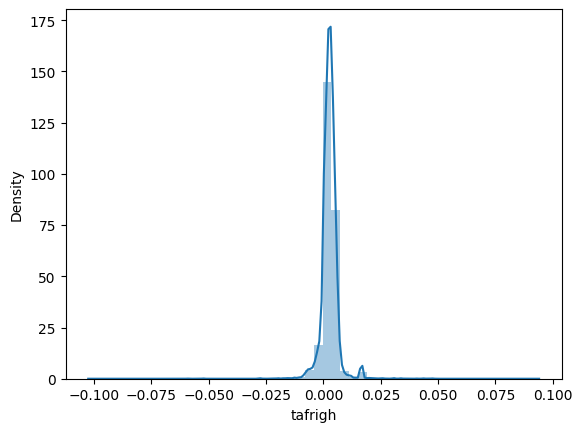

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sb
from scipy.stats import pearsonr
import numpy as np
import seaborn as sb
# 0: miyangin , 1: enheraf meyar , size: tedade adade random
#sample=np.random.normal(0,1,size=10000)
# size 1000 chon megdaresh ziyad hast, neshon dade nemishe.
#print("adade random: ",sample)
sb.distplot(e)
plt.show()

In [ ]:
print( 'obd_intakeairtemperature :' , obd_intakeairtemperature1 )
print('obd_intakemanifoldabsolutepressure:', obd_intakemanifoldabsolutepressure1)
print('obd_calculatedengineload:', obd_calculatedengineload1)
print('obd_coilchargingtime:', obd_coilchargingtime1)
print('obd_stepmotorposition:', obd_stepmotorposition1)
print('obd_enginerpm:', obd_enginerpm1)
print('obd_fuelinjectiontiming:', obd_fuelinjectiontiming1)
print('obd_throttleposition:', obd_throttleposition1)
print('obd_enginecoolanttemperature:', obd_enginecoolanttemperature1)
print('obd_canistervalve:', obd_canistervalve1)
print('obd_tpssensorvoltage:', obd_tpssensorvoltage1)
print('obd_downstreamo2sensorvoltage:', obd_downstreamo2sensorvoltage1)
print('ignition:', ignition1)
print('obd_sparkadvance:', obd_sparkadvance1)
print('speed:', speed1)
print('obd_batteryvoltage:', obd_batteryvoltage1)
print('movement:', movement1)
print('engineontime:', engineontime1)

obd_intakeairtemperature : 0.9983686289152239
obd_intakemanifoldabsolutepressure: 0.9981877271896529
obd_calculatedengineload: 0.17451376853210154
obd_coilchargingtime: 0.36243626118498096
obd_stepmotorposition: 0.8485173648718563
obd_enginerpm: 0.9986928606563485
obd_fuelinjectiontiming: 0.9827255003591756
obd_throttleposition: 0.9125277355930121
obd_enginecoolanttemperature: 0.9258310673270927
obd_canistervalve: 0.9998614268395005
obd_tpssensorvoltage: 0.8852851553204085
obd_downstreamo2sensorvoltage: 0.9998090608331867
ignition: 0.9999580485966594
obd_sparkadvance: 0.9997930901940864
speed: 0.9995848404527053
obd_batteryvoltage: 0.9997930901940864
movement: 0.9999576375151467
engineontime: 0.9999623900423503
